In [64]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_classification, make_blobs
from sklearn.cluster import KMeans, DBSCAN, AffinityPropagation, AgglomerativeClustering
from sklearn.metrics import silhouette_score, adjusted_rand_score, normalized_mutual_info_score, calinski_harabasz_score

# кастомные вспомогательные функции
from constants.parameters import *
from funcs.visualise_func import plot_cluster_analysis
from funcs.similar_data_filter import filter_similar_rows
from funcs.parameters_optimization import optimize_clustering_hyperparameters

# константа
palette = sns.cubehelix_palette(as_cmap=True)

# 1. Изучение примеров

Перед выполнением лабораторной работы были изучены представленные примеры

# 2. Загрузка и подготовка данных

In [54]:
# Датасет 1: 3 класса, 2 признака, хорошая разделимость
X1, y1 = make_classification(n_samples=500, n_features=2, n_classes=3,
                             n_clusters_per_class=1, n_redundant=0,
                             n_informative=2, random_state=42)
X1 = StandardScaler().fit_transform(X1)

df1 = pd.DataFrame(X1, columns=['Feature1', 'Feature2'])
# df1.to_csv(r'D:\Python\OmGTU\ML\data\lab_5_1.csv', index=False)

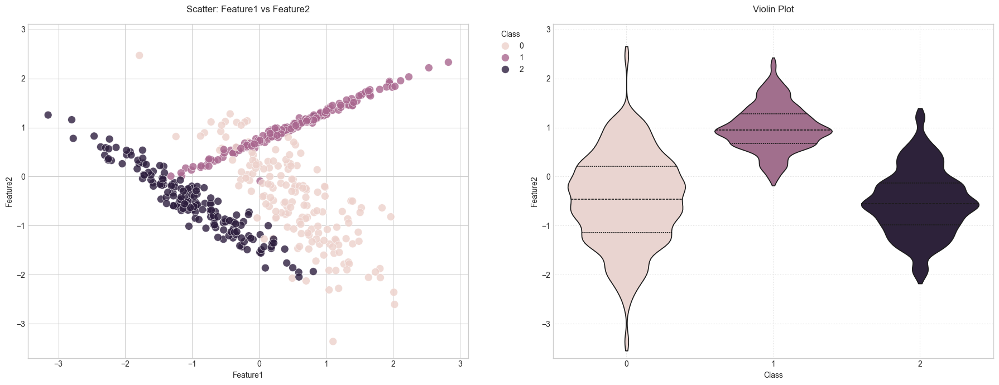

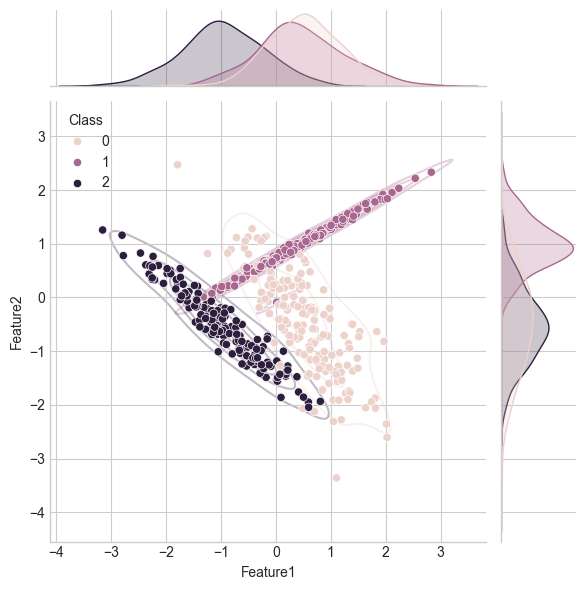

In [34]:
plot_cluster_analysis(df1, y1, palette=palette)

In [55]:
# Датасет 2: 4 класса, 2 признака, немного шума
X2, y2 = make_classification(n_samples=500, n_features=2, n_classes=4,
                             n_clusters_per_class=1, n_redundant=0,
                             n_informative=2, flip_y=0.05, random_state=123)
X2 = StandardScaler().fit_transform(X2)

df2 = pd.DataFrame(X2, columns=['Feature1', 'Feature2'])
# df2.to_csv(r'D:\Python\OmGTU\ML\data\lab_5_2.csv', index=False)

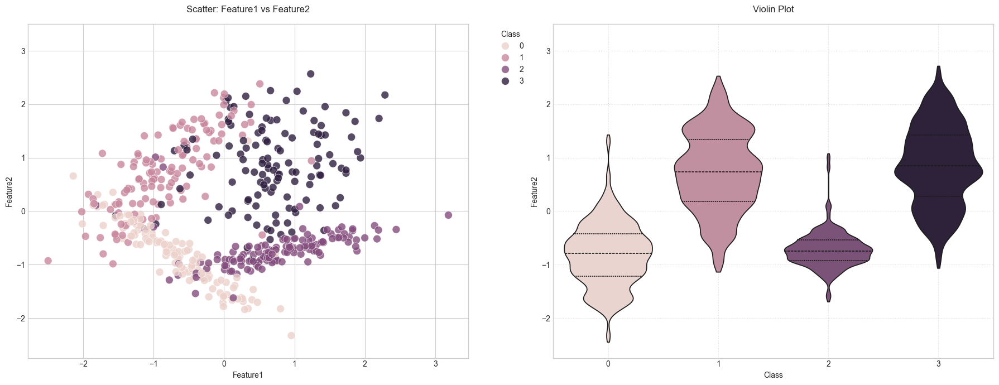

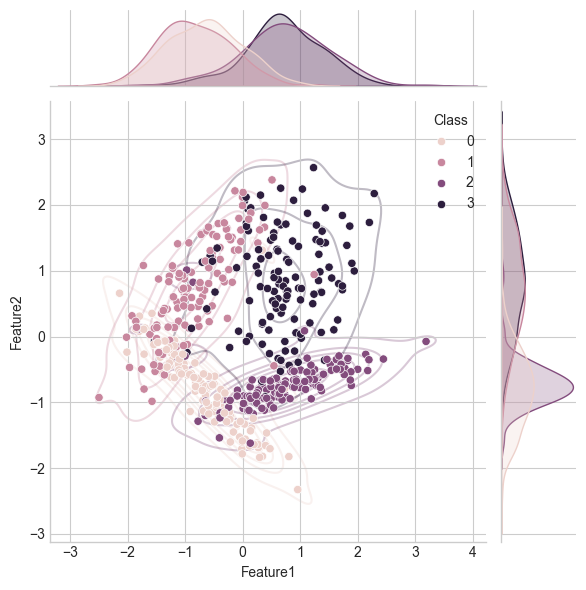

In [36]:
plot_cluster_analysis(df2, y2, palette=palette)

In [56]:
# Датасет 3: 5 классов, 3 признака
X3, y3 = make_classification(n_samples=1000, n_features=3, n_classes=5,
                             n_clusters_per_class=1, n_redundant=0,
                             n_informative=3, random_state=7)
X3 = StandardScaler().fit_transform(X3)

df3 = pd.DataFrame(X3, columns=['Feature1', 'Feature2', 'Feature3'])
# df3.to_csv(r'D:\Python\OmGTU\ML\data\lab_5_3.csv', index=False)

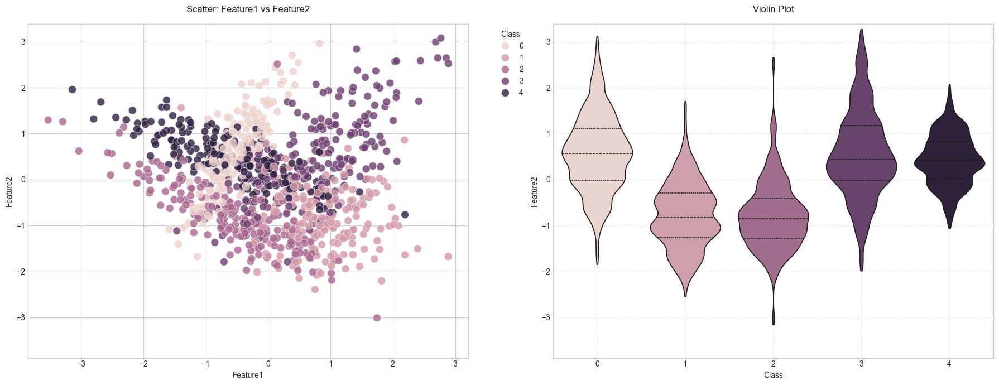

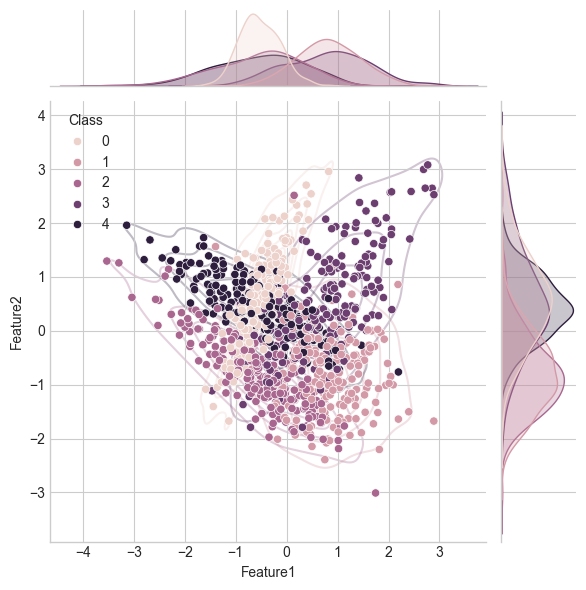

In [38]:
plot_cluster_analysis(df3, y3, palette=palette)

In [57]:
# Датасет 4: 3 кластера, 2 признака
X4, y4 = make_blobs(n_samples=300, n_features=2, centers=3,
                    cluster_std=0.8, random_state=42)
X4 = StandardScaler().fit_transform(X4)

df4 = pd.DataFrame(X4, columns=['Feature1', 'Feature2'])
# df4.to_csv(r'D:\Python\OmGTU\ML\data\lab_5_4.csv', index=False)

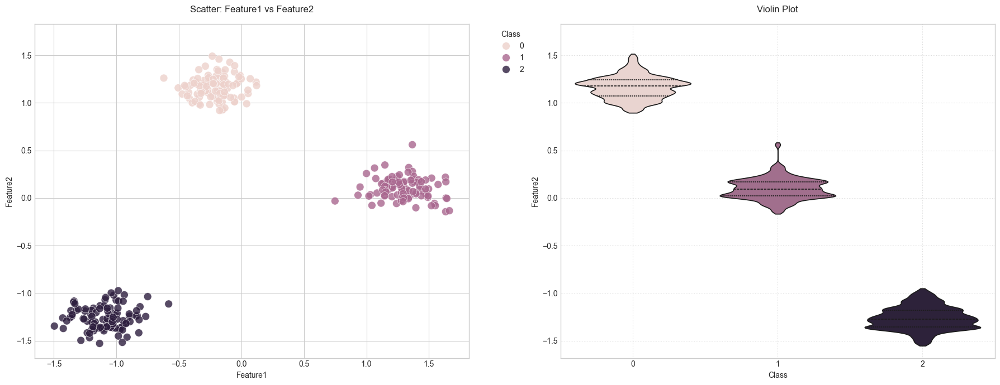

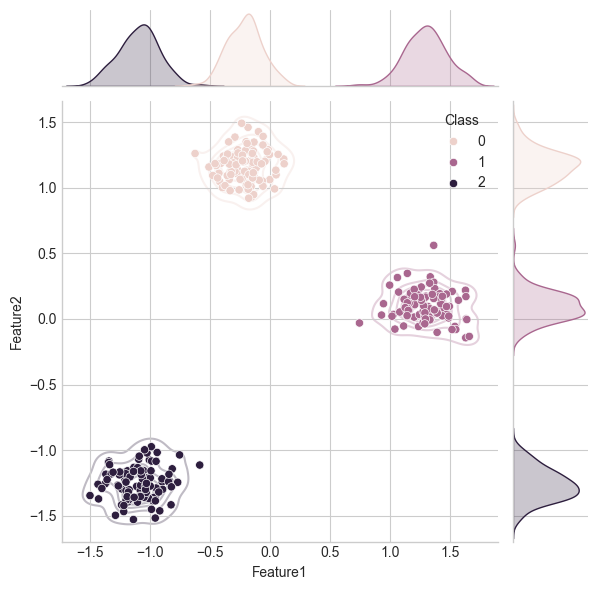

In [40]:
plot_cluster_analysis(df4, y4, palette=palette)

In [58]:
# Датасет 5: 6 кластеров, 2 признака, разная дисперсия
X5, y5 = make_blobs(n_samples=600, n_features=2, centers=6,
                    cluster_std=[0.5, 1.0, 0.7, 1.2, 0.9, 0.3],
                    random_state=123)
X5 = StandardScaler().fit_transform(X5)

df5 = pd.DataFrame(X5, columns=['Feature1', 'Feature2'])
# df5.to_csv(r'D:\Python\OmGTU\ML\data\lab_5_5.csv', index=False)

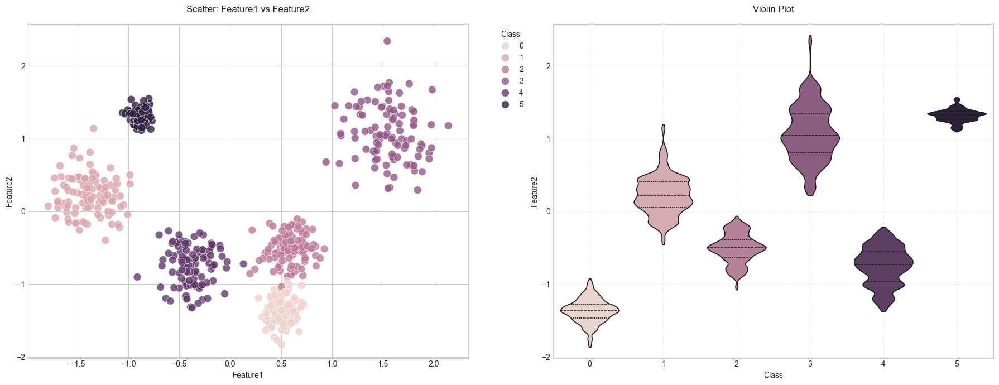

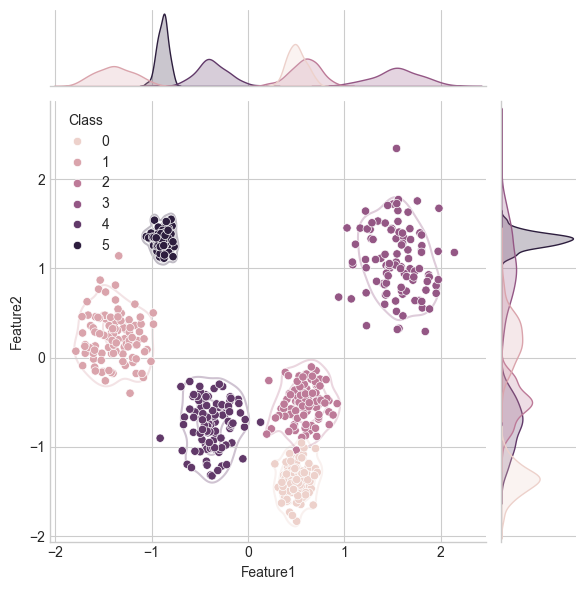

In [42]:
plot_cluster_analysis(df5, y5, palette=palette)

In [59]:
# Загрузка датасета
df_ = pd.read_csv(r'D:\Python\OmGTU\ML\data\post_card_transdata.csv').drop(columns=['Unnamed: 0'])

X = StandardScaler().fit_transform(df_.drop(columns=['fraud']))
y6 = df_['fraud'].to_numpy()

columns = list(df_.columns)
columns.remove('fraud')

df6 = pd.DataFrame(X, columns=columns)

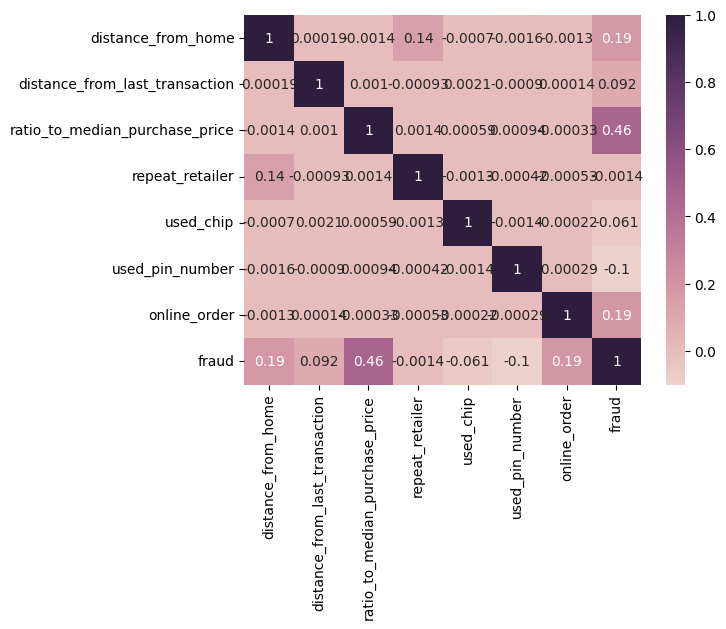

In [21]:
sns.heatmap(df_.corr(), annot=True, cmap=palette)
plt.show()

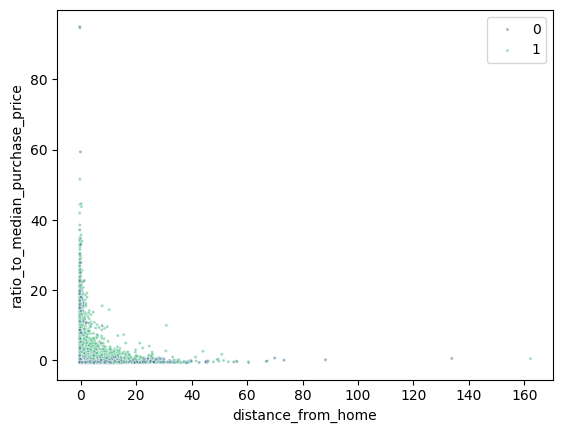

In [22]:
sns.scatterplot(
    data=df6,
    x='distance_from_home',
    y='ratio_to_median_purchase_price',
    hue=y6,
    palette='viridis',
    s=5,
    alpha=0.5,
    edgecolor='w',
    linewidth=0.5
)
plt.show()

In [60]:
df6['fraud'] = y6
df6 = filter_similar_rows(df6, 0.005, ignore_columns=['repeat_retailer', 'used_chip', 'used_pin_number', 'online_order', 'fraud'])
y6 = df6['fraud'].to_numpy()
df6.drop(columns=['fraud'], inplace=True)

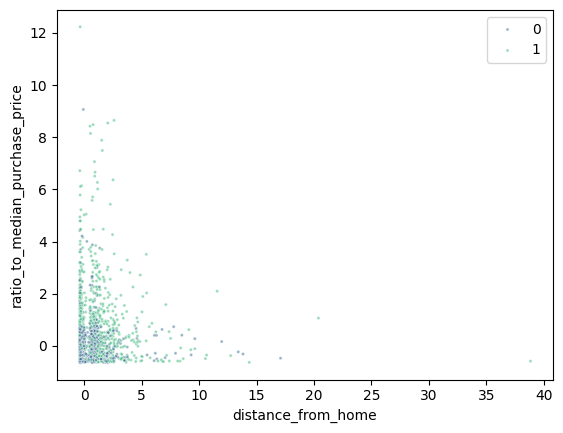

In [24]:
sns.scatterplot(
    data=df6,
    x='distance_from_home',
    y='ratio_to_median_purchase_price',
    hue=y6,
    palette='viridis',
    s=5,
    alpha=0.5,
    edgecolor='w',
    linewidth=0.5
)
plt.show()

In [25]:
df6.to_csv(r'D:\Python\OmGTU\ML\data\lab_5_card_transdata.csv', index=False)

# 3. Решение задачи кластеризации

In [68]:
dataframes = {'classification_1': pd.read_csv(r'D:\Python\OmGTU\ML\data\lab_5_1.csv'),
              'classification_2': pd.read_csv(r'D:\Python\OmGTU\ML\data\lab_5_2.csv'),
              'classification_3': pd.read_csv(r'D:\Python\OmGTU\ML\data\lab_5_3.csv'),
              'blobs_1': pd.read_csv(r'D:\Python\OmGTU\ML\data\lab_5_4.csv'),
              'blobs_2': pd.read_csv(r'D:\Python\OmGTU\ML\data\lab_5_5.csv'),
              'card_transdata': pd.read_csv(r'D:\Python\OmGTU\ML\data\lab_5_card_transdata.csv')}

true_y = {'classification_1': y1,
          'classification_2': y2,
          'classification_3': y3,
          'blobs_1': y4,
          'blobs_2': y5,
          'card_transdata': y6}

## Подбор гиперпараметров

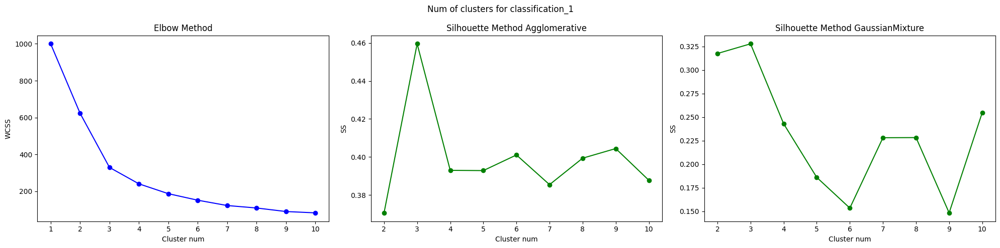

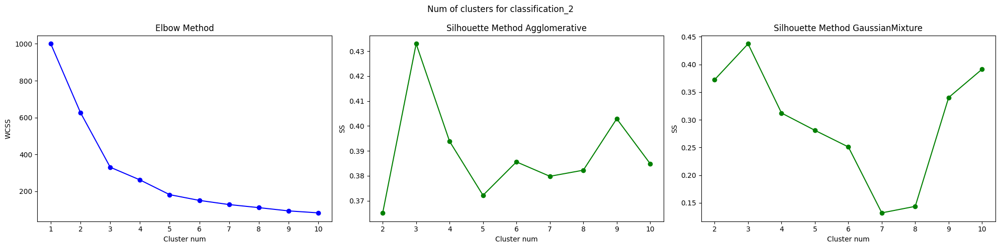

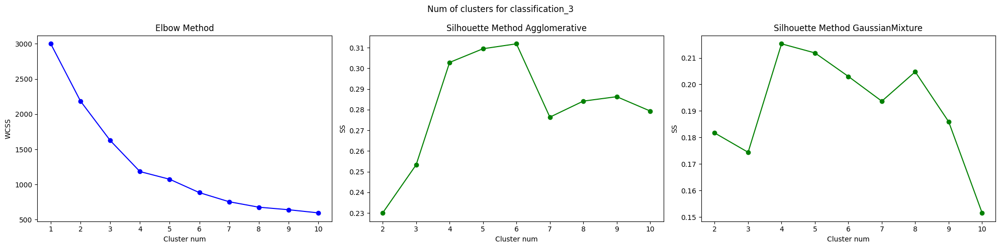

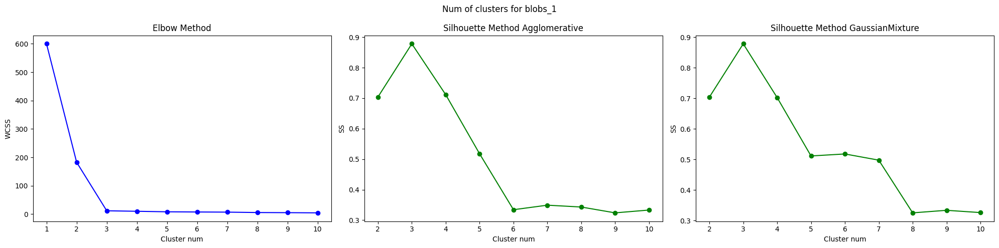

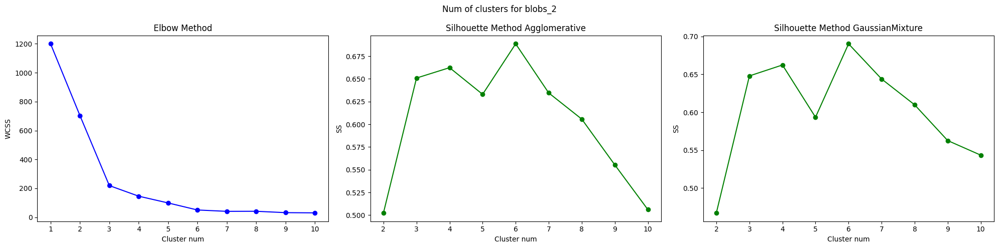

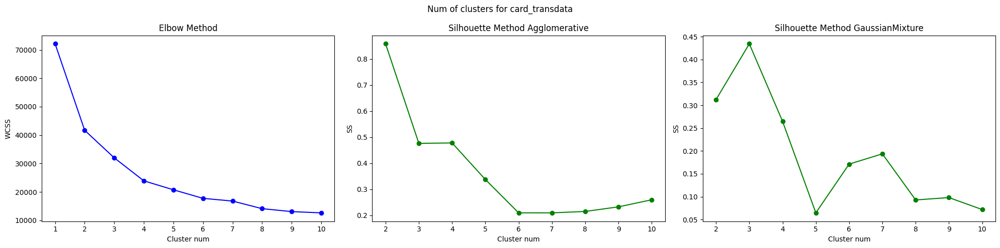

In [29]:
def plot_clustering_metrics(data, name):
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))
    fig.suptitle(f'Num of clusters for {name}')

    inertias = [KMeans(n_clusters=k, random_state=42).fit(data).inertia_ for k in range(1, 11)]
    
    axes[0].plot(range(1, 11), inertias, 'bo-')
    axes[0].set(xlabel='Cluster num', ylabel='WCSS', title='Elbow Method')
    axes[0].set_xticks(range(1, 11))

    algorithms = {'Agglomerative': lambda k: AgglomerativeClustering(n_clusters=k),
                  'GaussianMixture': lambda k: GaussianMixture(n_components=k, random_state=42)}
    
    for i, (name, model_func) in enumerate(algorithms.items(), 1):
        scores = [silhouette_score(data, model_func(k).fit_predict(data)) 
                for k in range(2, 11)]
        axes[i].plot(range(2, 11), scores, 'go-')
        axes[i].set(xlabel='Cluster num', ylabel='SS', 
                  title=f'Silhouette Method {name}')
    
    plt.tight_layout()
    plt.show()

for name, data in dataframes.items():
    plot_clustering_metrics(data, name)

| Algorithm         | Clusters                                                 |
|-------------------|----------------------------------------------------------|
| **K-Means**       | df1: 3<br>df2: 3<br>df3: 4<br>df4: 3<br>df5: 3<br>df6: 4 |
| **Agglomerative** | df1: 3<br>df2: 3<br>df3: 6<br>df4: 3<br>df5: 6<br>df6: 2 |
| **Gaussian**      | df1: 3<br>df2: 3<br>df3: 4<br>df4: 3<br>df5: 6<br>df6: 3 |

In [66]:
clusters = {'kmeans': {'classification_1': [2, 3, 4],
                       'classification_2': [2, 3, 4],
                       'classification_3': [3, 4, 5],
                       'blobs_1': [2, 3, 4],
                       'blobs_2': [2, 3, 4],
                       'card_transdata': [3, 4, 5]},
            'gaussian': {'classification_1': [2, 3, 4],
                       'classification_2': [2, 3, 4],
                       'classification_3': [3, 4, 5],
                       'blobs_1': [2, 3, 4],
                       'blobs_2': [5, 6, 7],
                       'card_transdata': [2, 3, 4]},
            'agglomeratve': {'classification_1': [2, 3, 4],
                       'classification_2': [2, 3, 4],
                       'classification_3': [5, 6, 7],
                       'blobs_1': [2, 3, 4],
                       'blobs_2': [5, 6, 7],
                       'card_transdata': [2, 3]}}

In [17]:
algorythms = {'kmeans': (KMeans, kmeans_params),
              'dbscan': (DBSCAN, dbscan_params),
              'gaussian': (GaussianMixture, gmm_params),
              'agglomeratve': (AgglomerativeClustering, agglomerative_params),
              'affinity': (AffinityPropagation, affinity_propagation_params)}

In [ ]:
optimized_params = {name: {} for name in algorythms.keys()}

for name_alg, algorythm in algorythms.items():
    for name_data, data in dataframes.items():

        if name_alg in clusters:
            if name_alg == 'gaussian':
                algorythm[1]['n_components']['values'] = clusters[name_alg][name_data]
            else:
                algorythm[1]['n_clusters']['values'] = clusters[name_alg][name_data]

        best_score, best_params = optimize_clustering_hyperparameters(
            df=data,
            model_class=algorythm[0],
            param_grid=algorythm[1],
            n_trials=150,
            random_state=42)
        
        optimized_params[name_alg][name_data] = (best_score, best_params)

[I 2025-05-01 15:45:58,847] A new study created in memory with name: no-name-5bc9b887-7384-47e5-9084-288663c520b0
[I 2025-05-01 15:45:59,232] Trial 1 finished with value: 0.38362897718913963 and parameters: {'n_clusters': 2, 'init': 'random', 'n_init': 14, 'random_state': 42}. Best is trial 1 with value: 0.38362897718913963.
[I 2025-05-01 15:45:59,252] Trial 2 finished with value: 0.4575492380148933 and parameters: {'n_clusters': 4, 'init': 'random', 'n_init': 14, 'random_state': 42}. Best is trial 2 with value: 0.4575492380148933.
[I 2025-05-01 15:45:59,304] Trial 4 finished with value: 0.4575492380148933 and parameters: {'n_clusters': 4, 'init': 'random', 'n_init': 16, 'random_state': 42}. Best is trial 2 with value: 0.4575492380148933.
[I 2025-05-01 15:45:59,336] Trial 6 finished with value: 0.38362897718913963 and parameters: {'n_clusters': 2, 'init': 'k-means++', 'n_init': 17, 'random_state': 42}. Best is trial 2 with value: 0.4575492380148933.
[I 2025-05-01 15:45:59,374] Trial 3 

In [14]:
optimized_params

{'kmeans': {'classification_1': (0.4707623076478922,
   {'n_clusters': 3, 'init': 'k-means++', 'n_init': 14, 'random_state': 42}),
  'classification_2': (0.45175387682112067,
   {'n_clusters': 3, 'init': 'random', 'n_init': 16, 'random_state': 42}),
  'classification_3': (0.34626685443364785,
   {'n_clusters': 4, 'init': 'random', 'n_init': 5, 'random_state': 42}),
  'blobs_1': (0.8783134858331793,
   {'n_clusters': 3, 'init': 'k-means++', 'n_init': 5, 'random_state': 42}),
  'blobs_2': (0.6621656891304065,
   {'n_clusters': 4, 'init': 'k-means++', 'n_init': 6, 'random_state': 42}),
  'card_transdata': (0.8143204631106542,
   {'n_clusters': 3, 'init': 'k-means++', 'n_init': 14, 'random_state': 42})},
 'dbscan': {'classification_1': (0.5093047997483025,
   {'eps': 0.74, 'min_samples': 17, 'n_jobs': -1}),
  'classification_2': (0.4294842903432295,
   {'eps': 0.54, 'min_samples': 6, 'n_jobs': -1}),
  'classification_3': (0.5140845328817686,
   {'eps': 1.31, 'min_samples': 19, 'n_jobs': -1

In [15]:
optimized_params = {'kmeans': {'classification_1': (0.4707623076478922,
   {'n_clusters': 3, 'init': 'k-means++', 'n_init': 14, 'random_state': 42}),
  'classification_2': (0.45175387682112067,
   {'n_clusters': 3, 'init': 'random', 'n_init': 16, 'random_state': 42}),
  'classification_3': (0.34626685443364785,
   {'n_clusters': 4, 'init': 'random', 'n_init': 5, 'random_state': 42}),
  'blobs_1': (0.8783134858331793,
   {'n_clusters': 3, 'init': 'k-means++', 'n_init': 5, 'random_state': 42}),
  'blobs_2': (0.6621656891304065,
   {'n_clusters': 4, 'init': 'k-means++', 'n_init': 6, 'random_state': 42}),
  'card_transdata': (0.8143204631106542,
   {'n_clusters': 3, 'init': 'k-means++', 'n_init': 14, 'random_state': 42})},
 'dbscan': {'classification_1': (0.5093047997483025,
   {'eps': 0.74, 'min_samples': 17, 'n_jobs': -1}),
  'classification_2': (0.4294842903432295,
   {'eps': 0.54, 'min_samples': 6, 'n_jobs': -1}),
  'classification_3': (0.5140845328817686,
   {'eps': 1.31, 'min_samples': 19, 'n_jobs': -1}),
  'blobs_1': (0.8783134858331793,
   {'eps': 0.6, 'min_samples': 3, 'n_jobs': -1}),
  'blobs_2': (0.6551937843209015,
   {'eps': 0.32, 'min_samples': 7, 'n_jobs': -1}),
  'card_transdata': (0.19814690032704516,
   {'eps': 1.06, 'min_samples': 2, 'n_jobs': -1})},
 'gaussian': {'classification_1': (0.46910215059313315,
   {'n_components': 3, 'covariance_type': 'spherical', 'random_state': 42}),
  'classification_2': (0.44917522204648647,
   {'n_components': 3, 'covariance_type': 'spherical', 'random_state': 42}),
  'classification_3': (0.3420602665062453,
   {'n_components': 4, 'covariance_type': 'spherical', 'random_state': 42}),
  'blobs_1': (0.8783134858331793,
   {'n_components': 3, 'covariance_type': 'tied', 'random_state': 42}),
  'blobs_2': (0.6913867601651968,
   {'n_components': 6, 'covariance_type': 'tied', 'random_state': 42}),
  'card_transdata': (0.8582203090561016,
   {'n_components': 2, 'covariance_type': 'tied', 'random_state': 42})},
 'agglomeratve': {'classification_1': (0.4595426300552932,
   {'n_clusters': 3, 'linkage': 'ward'}),
  'classification_2': (0.432942353852418,
   {'n_clusters': 3, 'linkage': 'ward'}),
  'classification_3': (0.31186499774399207,
   {'n_clusters': 6, 'linkage': 'ward'}),
  'blobs_1': (0.8783134858331793, {'n_clusters': 3, 'linkage': 'complete'}),
  'blobs_2': (0.658522207720005, {'n_clusters': 7, 'linkage': 'average'}),
  'card_transdata': (0.9515147496691656,
   {'n_clusters': 2, 'linkage': 'complete'})},
 'affinity': {'classification_1': (0.43538532440166855,
   {'damping': 0.63, 'random_state': 42}),
  'classification_2': (0.4097998054183164,
   {'damping': 0.8400000000000001, 'random_state': 42}),
  'classification_3': (0.2946517671425541,
   {'damping': 0.81, 'random_state': 42}),
  'blobs_1': (0.8783134858331793, {'damping': 0.81, 'random_state': 42}),
  'blobs_2': (0.6430702856516557, {'damping': 0.97, 'random_state': 42}),
  'card_transdata': (0.36892725078736777,
   {'damping': 0.72, 'random_state': 42})}}

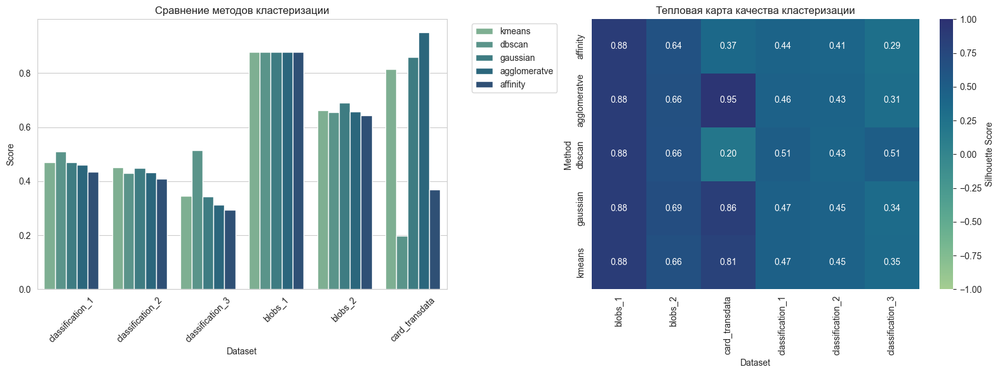

In [19]:
def get_predictions(model, model_type, X):
    if model_type == 'gaussian':
        return model.fit(X).predict(X)
    elif model_type == 'affinity':
        return model.fit_predict(X)
    else:
        return model.fit_predict(X)

new_results = {}

for method, datasets in optimized_params.items():
    new_results[method] = {}
    model_class, _ = algorythms[method]
    
    for dataset_name, (_, params) in datasets.items():
        X = dataframes[dataset_name].values
        
        try:
            model = model_class(**params)
            labels = get_predictions(model, method, X)
            unique_labels = np.unique(labels)

            if len(unique_labels) < 2:
                score = -1
            else:
                score = silhouette_score(X, labels)

            new_results[method][dataset_name] = (score, params)
            
        except Exception as e:
            print(f"Ошибка для {method} на {dataset_name}: {str(e)}")
            new_results[method][dataset_name] = (-1, params)

def visualize_results(results):

    res_list = []
    for method, datasets in results.items():
        for dataset, (score, params) in datasets.items():
            row = {'Method': method, 'Dataset': dataset, 'Score': score}
            row.update(params)
            res_list.append(row)
            
    df = pd.DataFrame(res_list)
   
    plt.figure(figsize=(16, 6))
    sns.set_style("whitegrid")

    plt.subplot(1, 2, 1)
    sns.barplot(data=df, x='Dataset', y='Score', hue='Method', palette='crest')
    plt.title('Сравнение методов кластеризации')
    plt.xticks(rotation=45)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.subplot(1, 2, 2)
    heatmap_data = df.pivot_table(index='Method', columns='Dataset', values='Score')
    sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap='crest', 
                cbar_kws={'label': 'Silhouette Score'}, vmin=-1, vmax=1)
    plt.title('Тепловая карта качества кластеризации')
    
    plt.tight_layout()
    plt.show()

visualize_results(new_results)

## Проверка работы алгоритмов

In [ ]:
labels = {i: {} for i in algorythms.keys()}

for name_alg, algorythm in algorythms.items():
    for name_data, data in dataframes.items():
        labels[name_alg][name_data] = algorythm[0](**optimized_params[name_alg][name_data][1]).fit_predict(data)

### K-Means

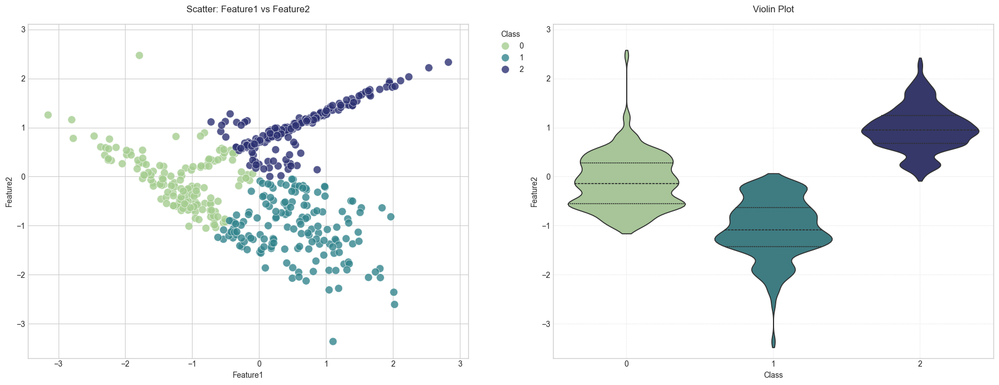

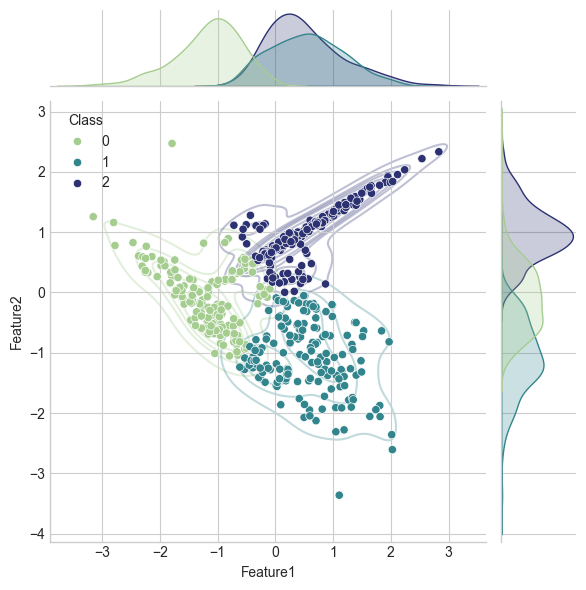

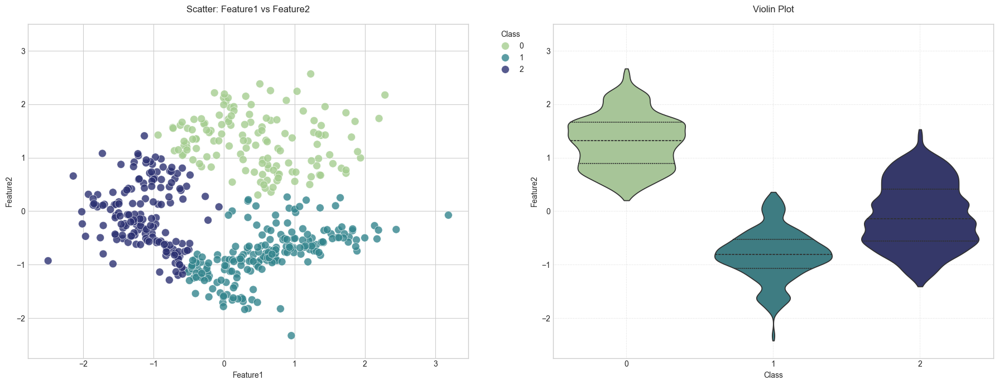

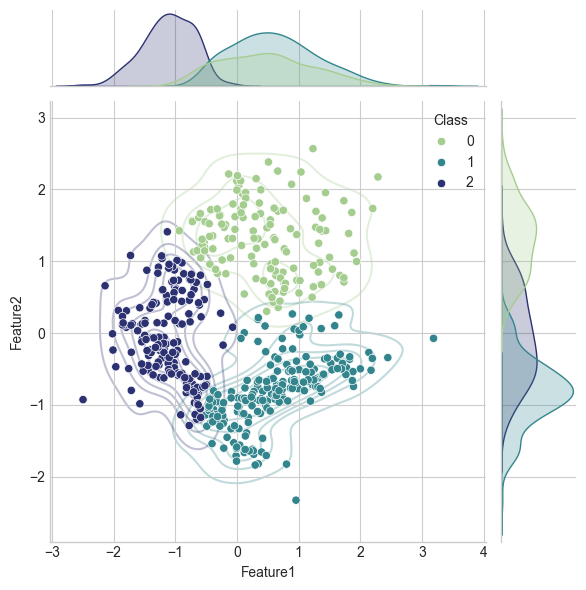

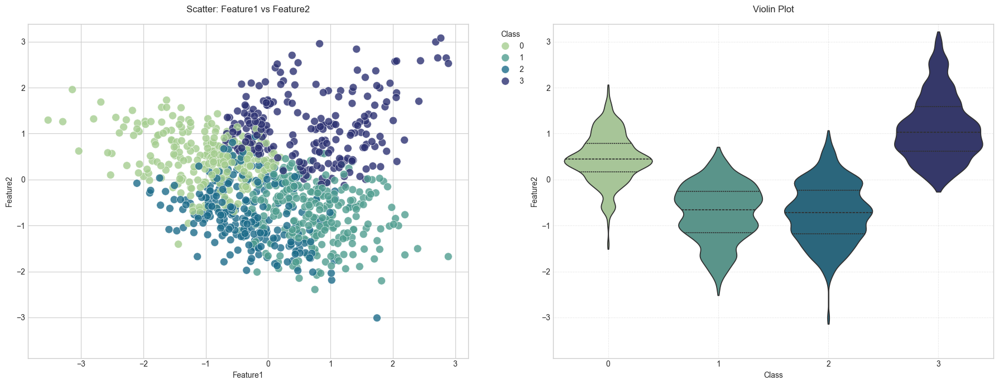

...

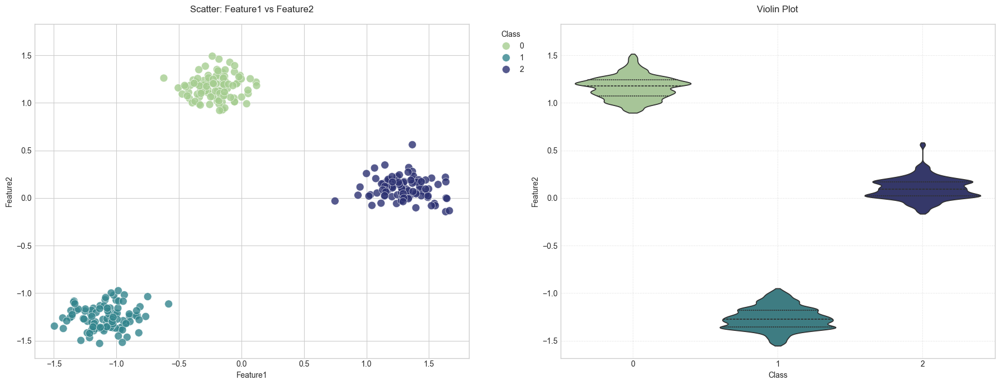

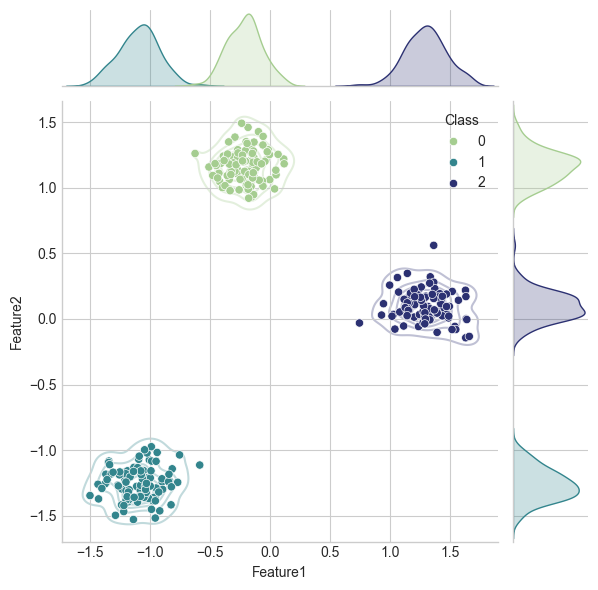

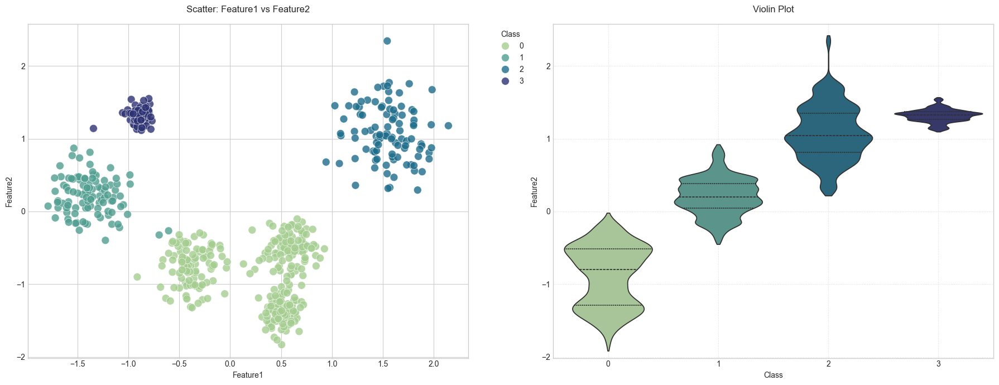

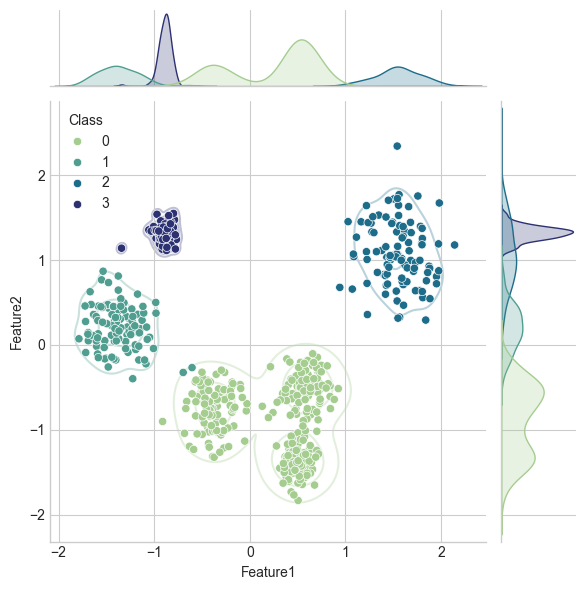

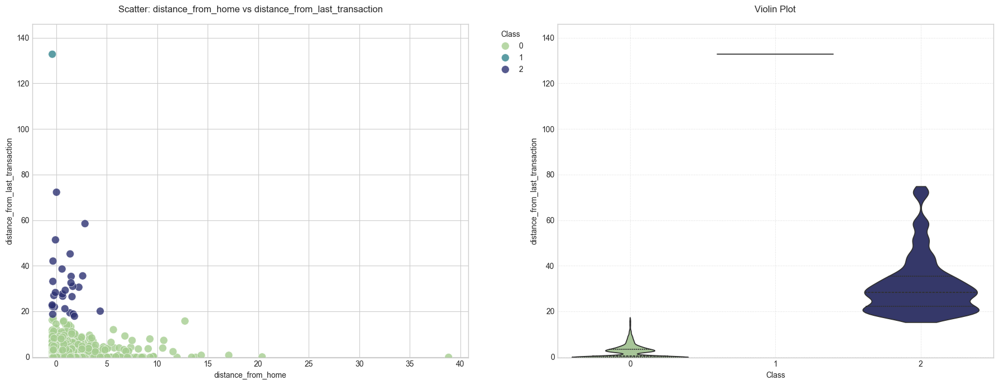

d:\Python\OmGTU\venv\Lib\site-packages\seaborn\axisgrid.py:1832: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=self.x, y=self.y, **kwargs)


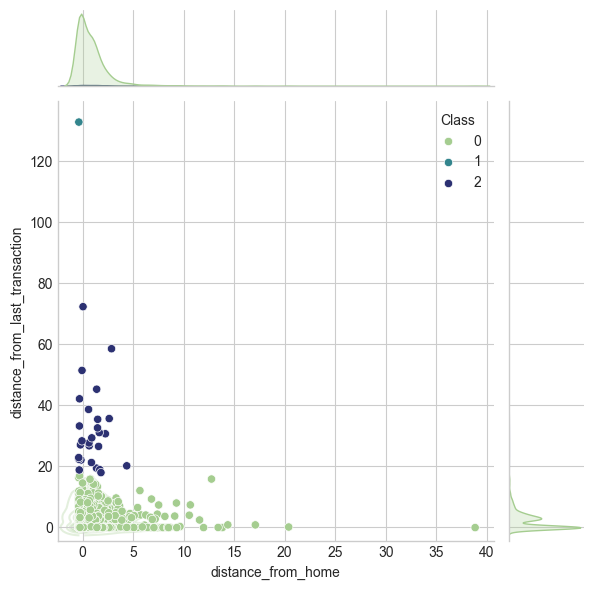

In [35]:
for name, data in dataframes.items():
    plot_cluster_analysis(data, labels['kmeans'][name])

### DBSCAN

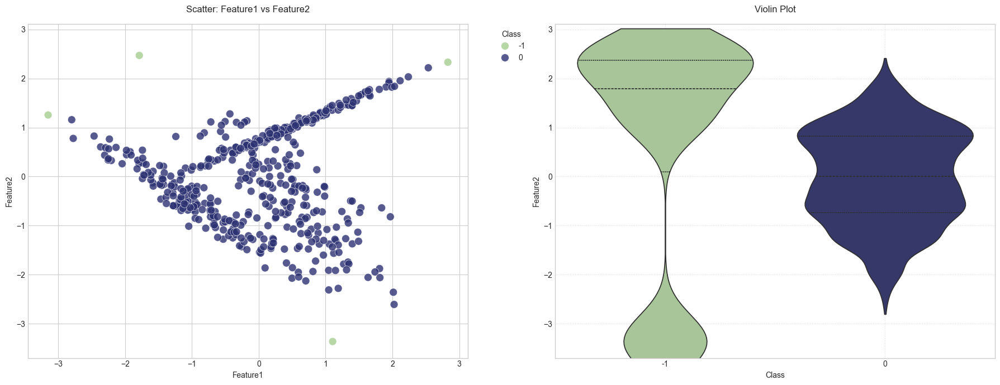

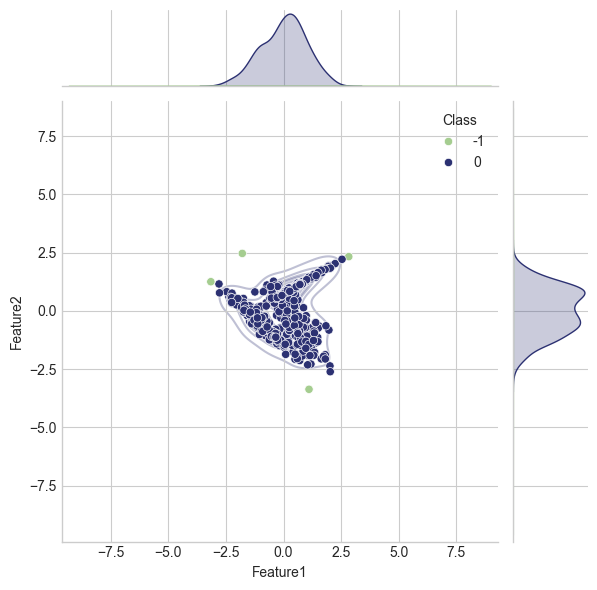

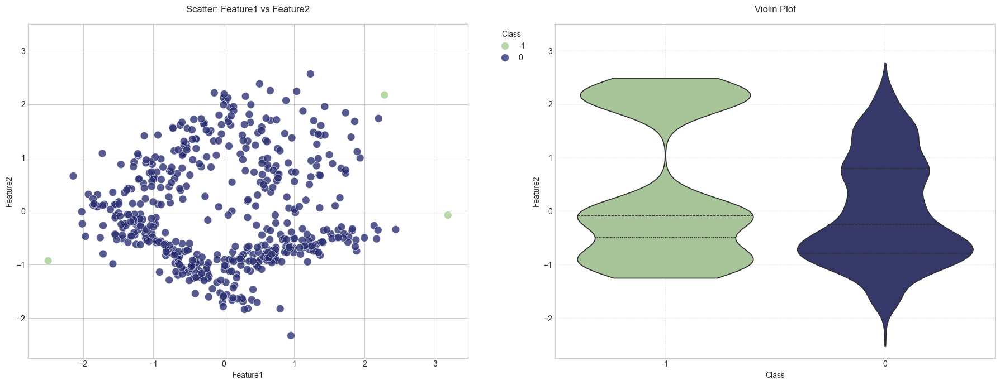

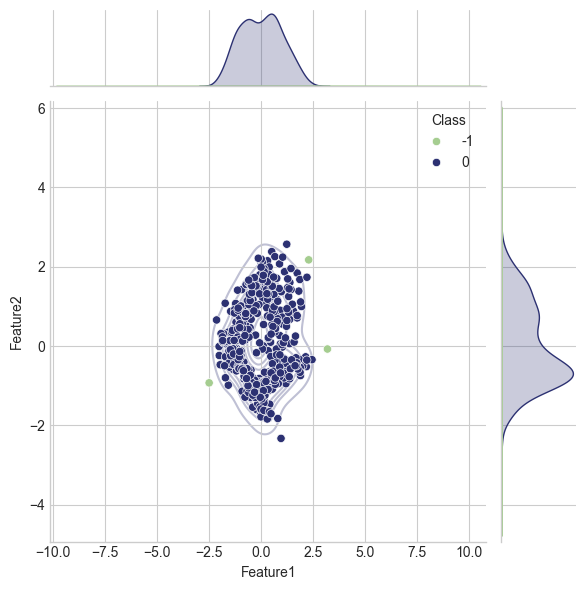

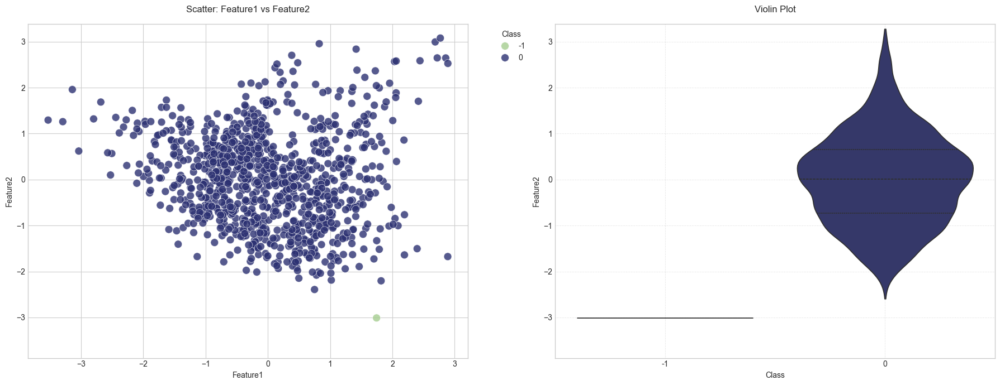

d:\Python\OmGTU\venv\Lib\site-packages\seaborn\axisgrid.py:1832: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=self.x, y=self.y, **kwargs)


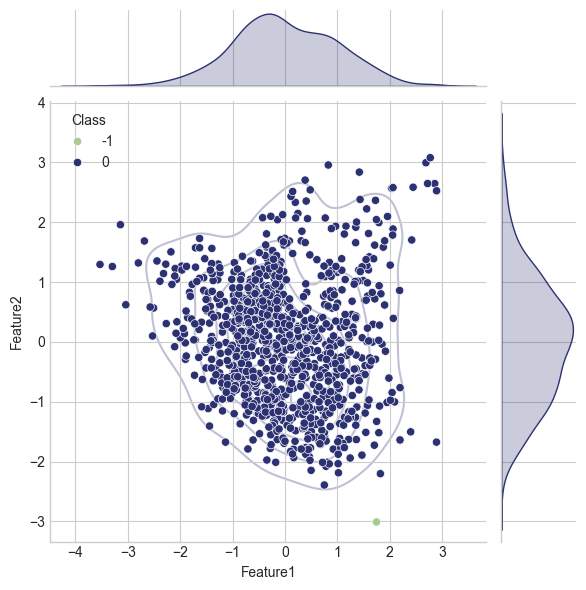

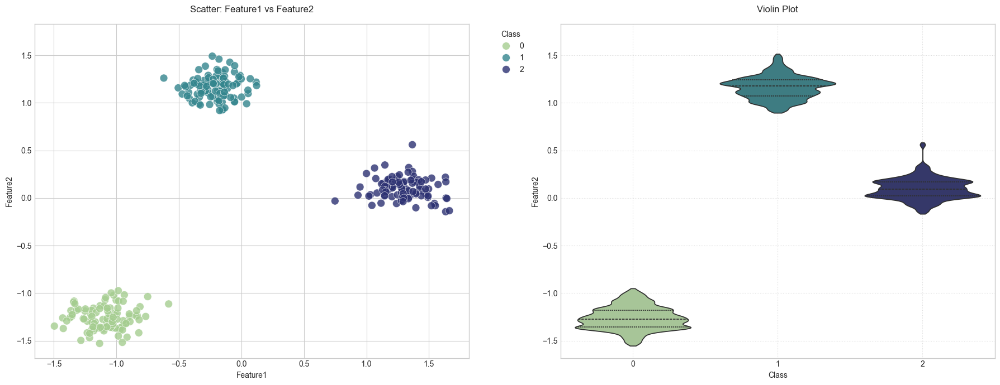

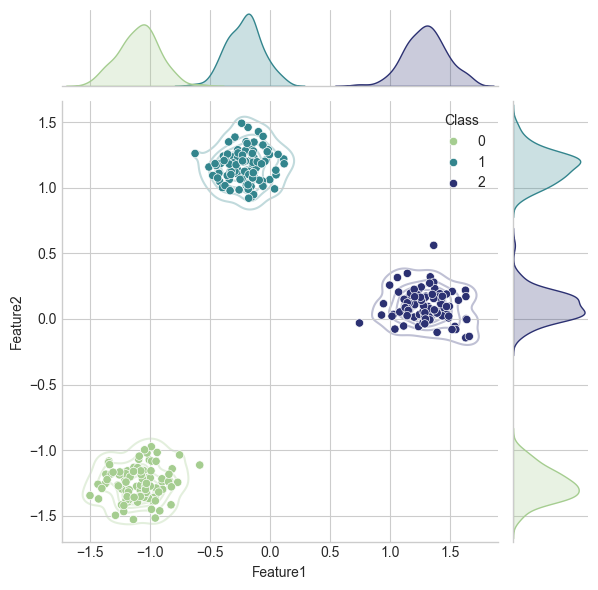

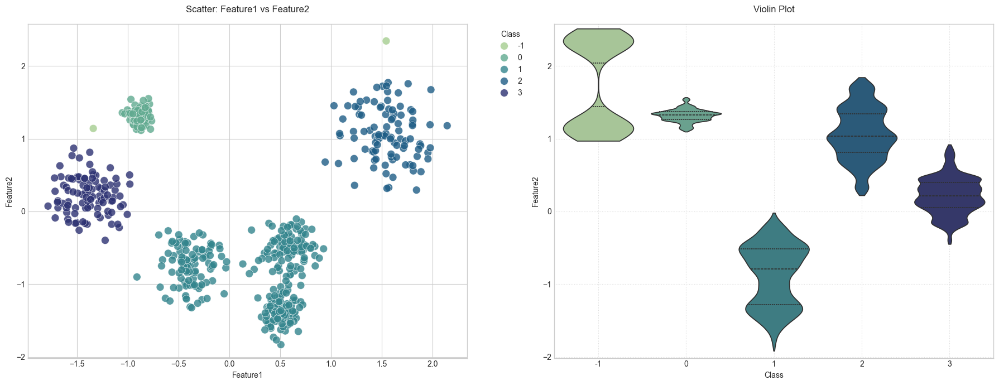

d:\Python\OmGTU\venv\Lib\site-packages\seaborn\axisgrid.py:1832: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=self.x, y=self.y, **kwargs)


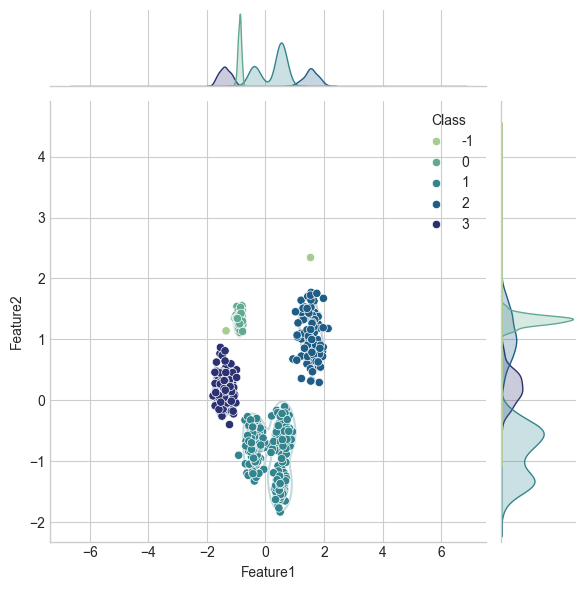

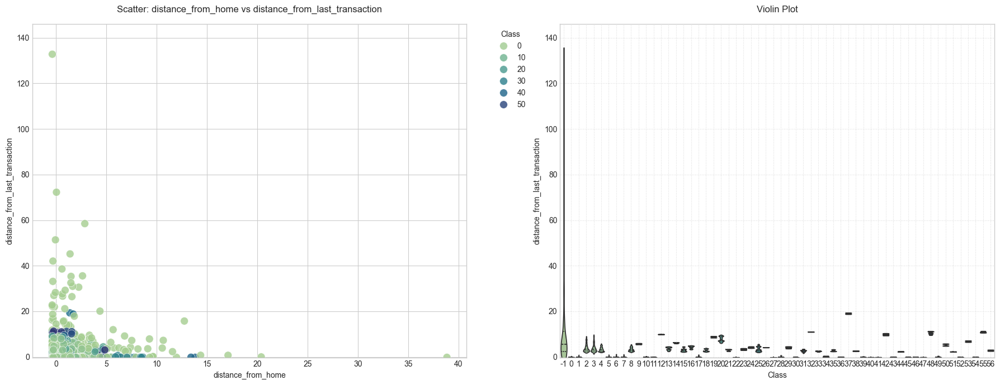

d:\Python\OmGTU\venv\Lib\site-packages\seaborn\axisgrid.py:1832: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=self.x, y=self.y, **kwargs)
d:\Python\OmGTU\venv\Lib\site-packages\seaborn\axisgrid.py:1832: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=self.x, y=self.y, **kwargs)
d:\Python\OmGTU\venv\Lib\site-packages\seaborn\axisgrid.py:1832: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=self.x, y=self.y, **kwargs)
d:\Python\OmGTU\venv\Lib\site-packages\seaborn\axisgrid.py:1832: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=self.x, y=self.y, **kwargs)
d:\Python\OmGTU\venv\Lib\site-packages\seaborn\axisgrid.py:1832: UserWarning: KDE cannot be 

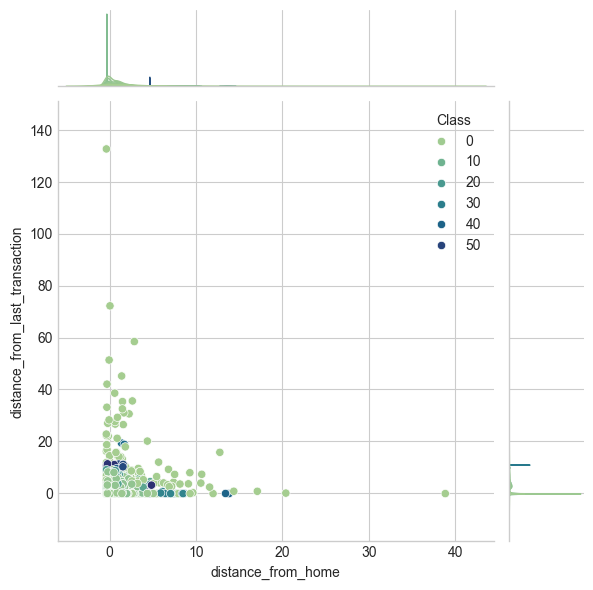

In [36]:
for name, data in dataframes.items():
    plot_cluster_analysis(data, labels['dbscan'][name])

### Gaussian Mixture

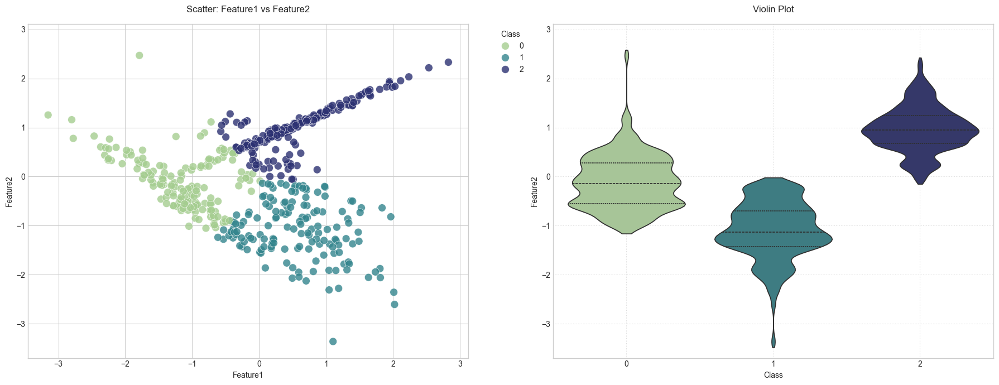

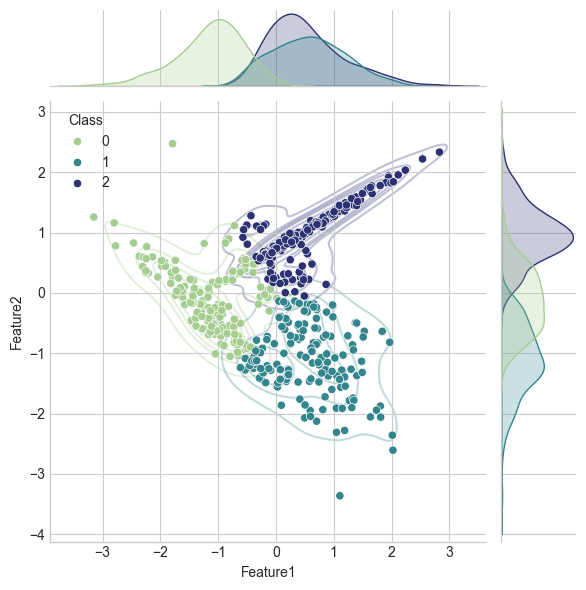

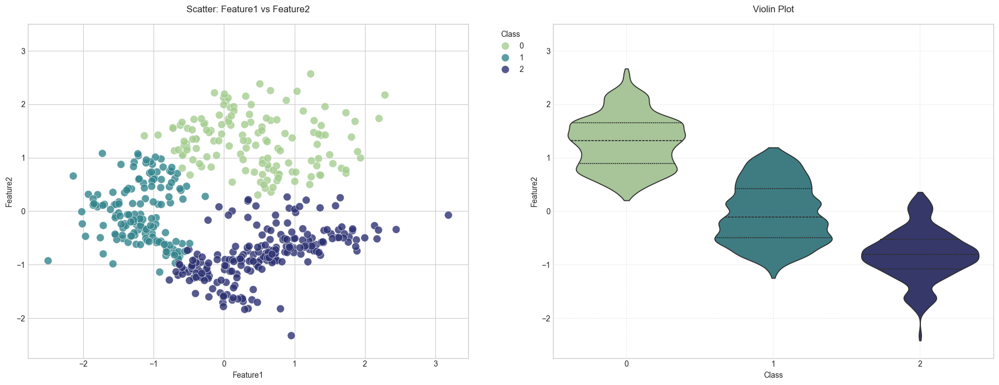

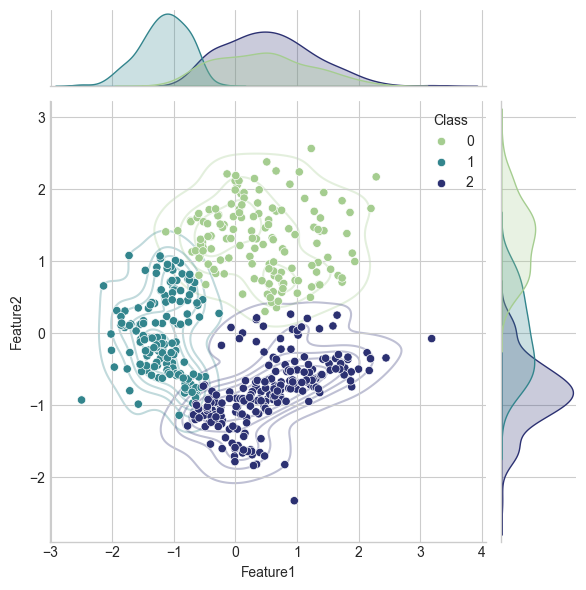

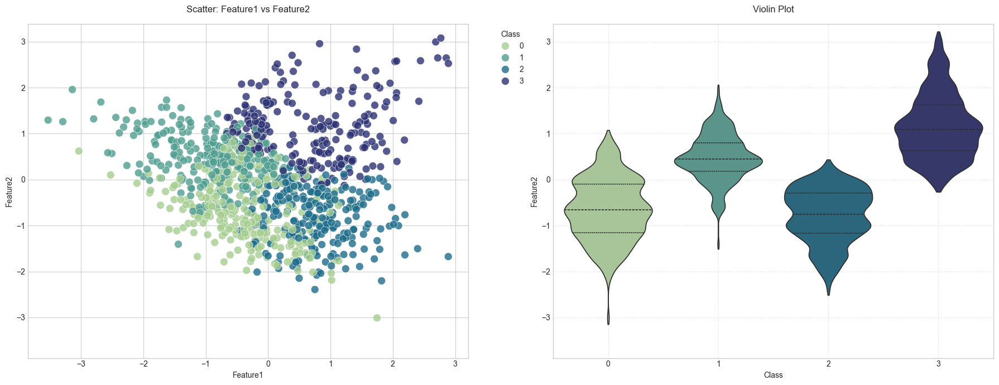

...

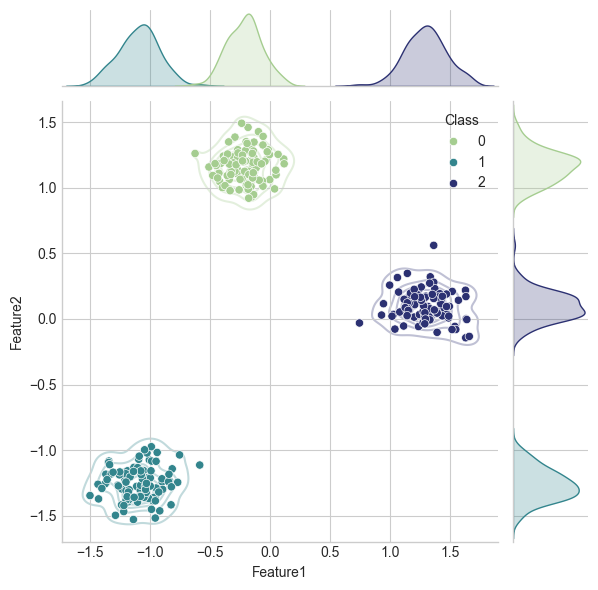

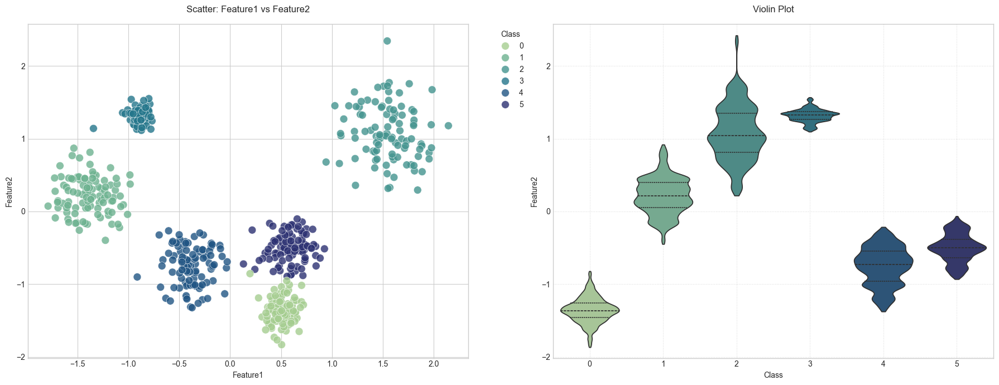

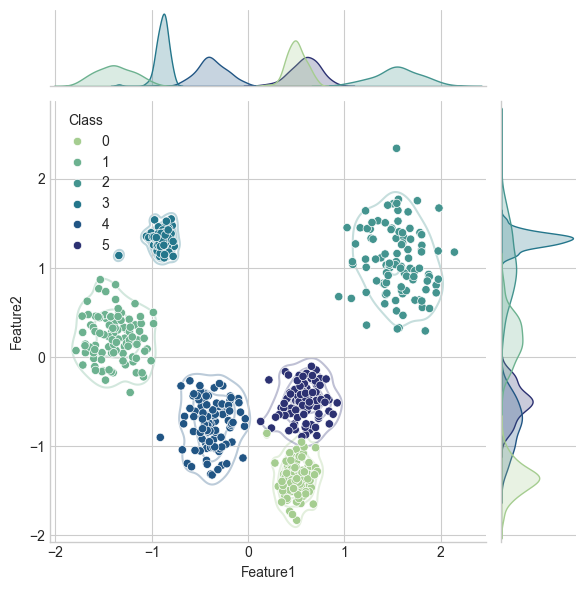

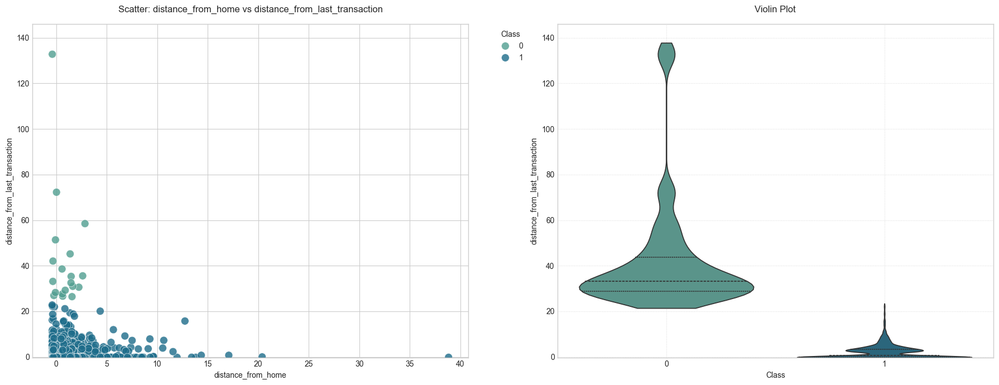

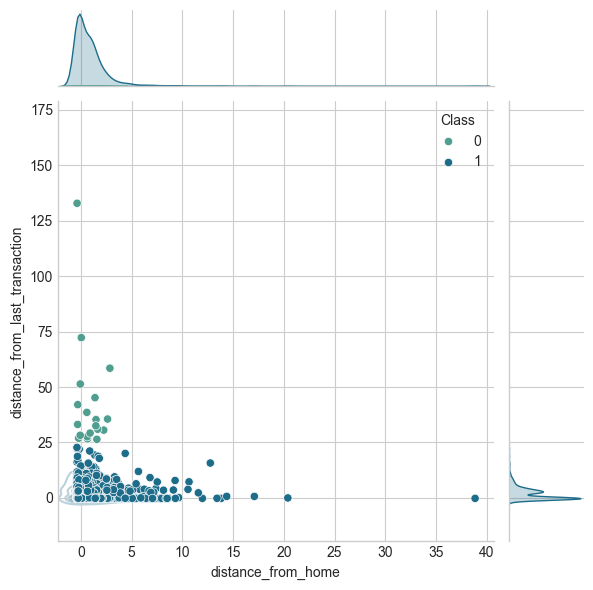

In [37]:
for name, data in dataframes.items():
    plot_cluster_analysis(data, labels['gaussian'][name])

### Agglomerative

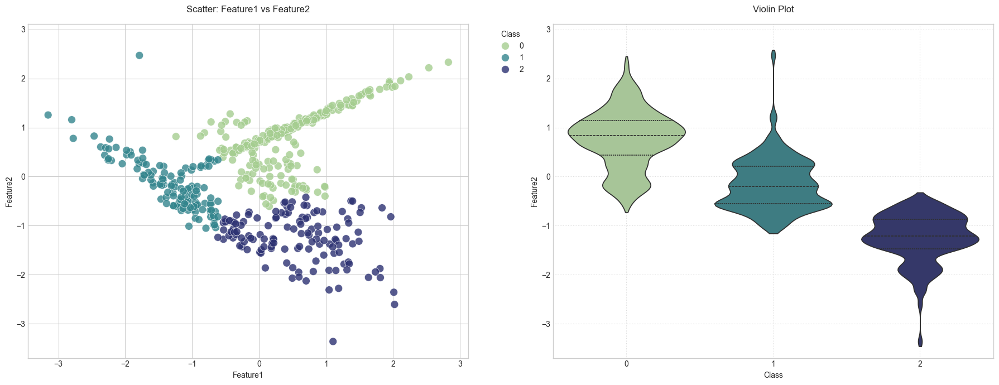

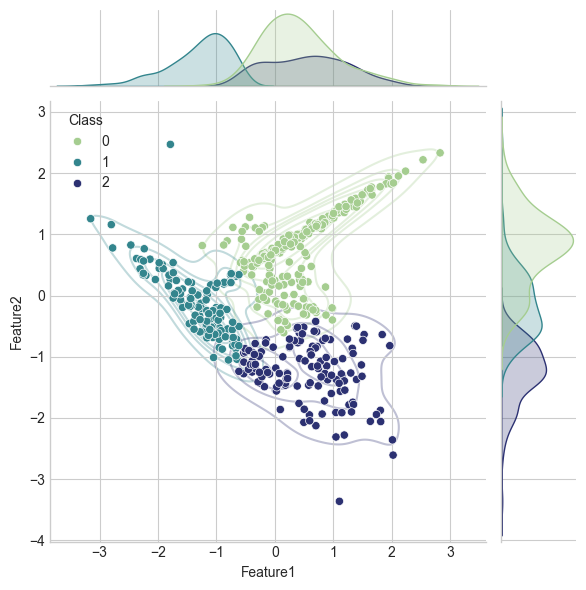

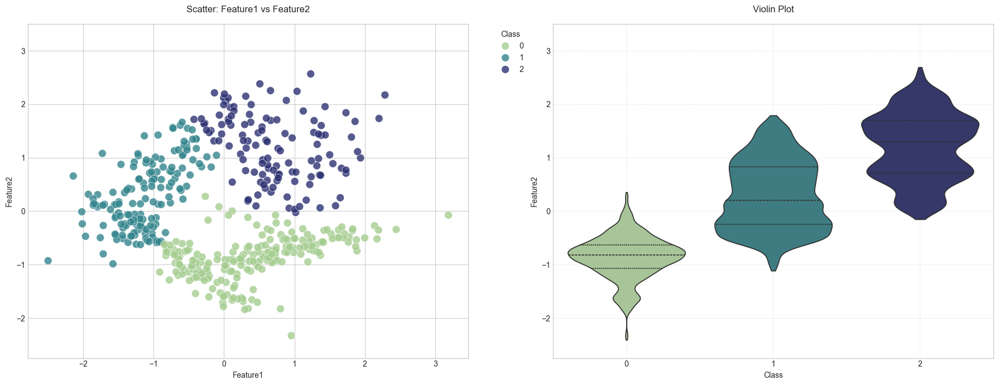

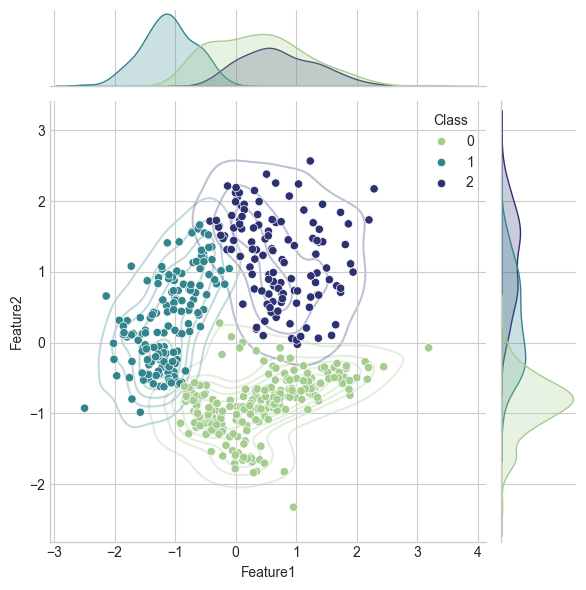

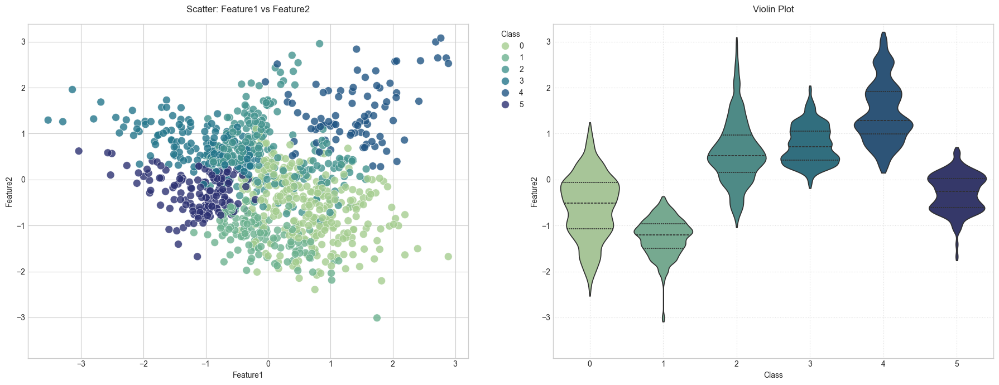

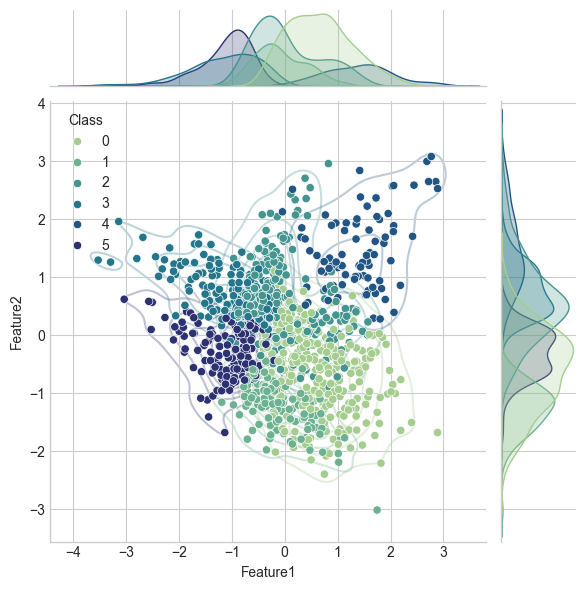

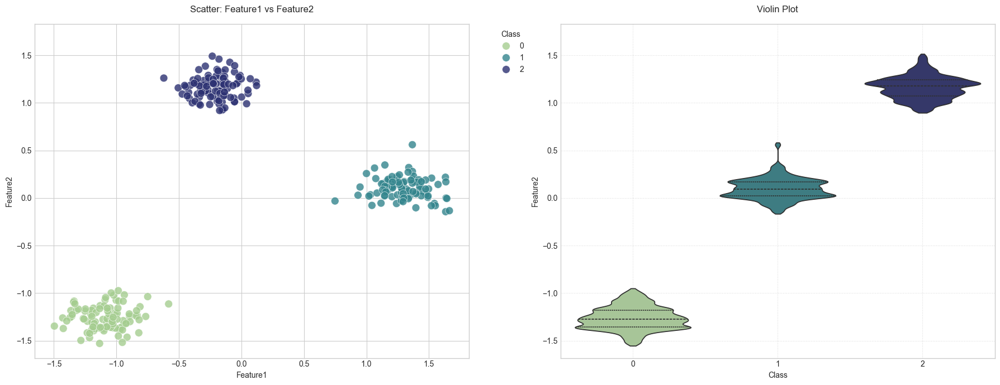

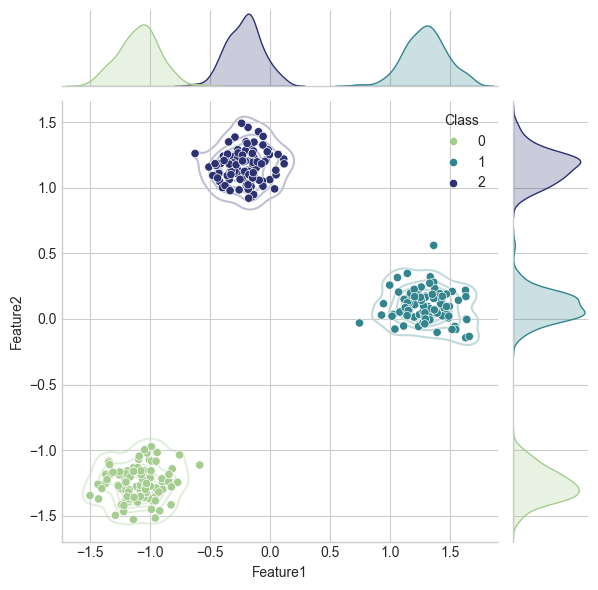

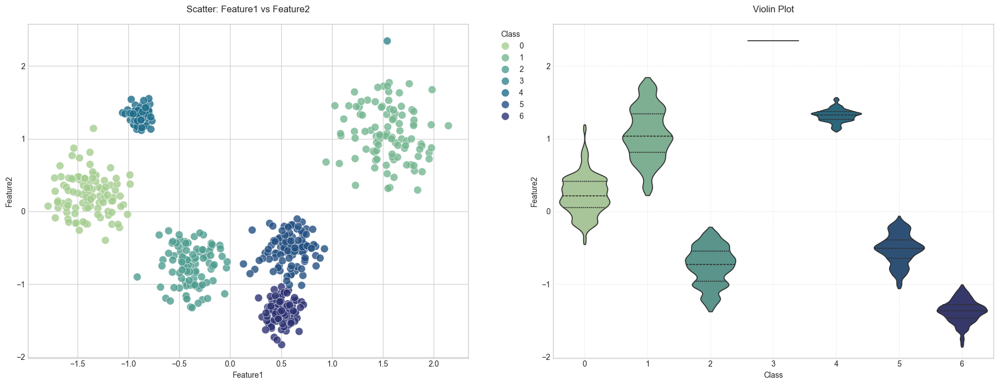

d:\Python\OmGTU\venv\Lib\site-packages\seaborn\axisgrid.py:1832: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=self.x, y=self.y, **kwargs)


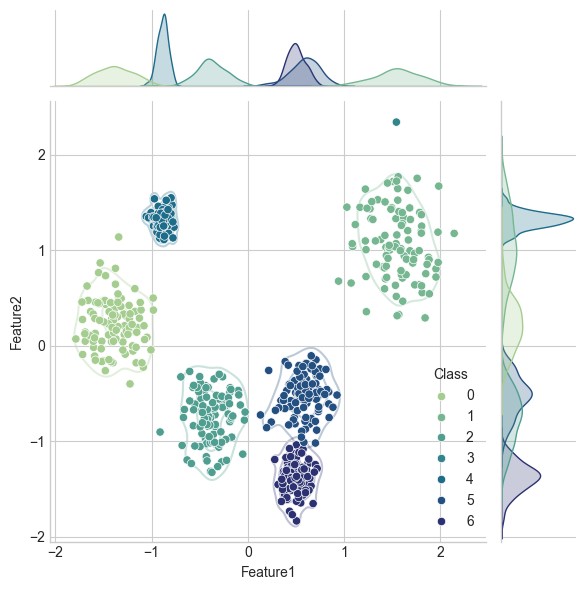

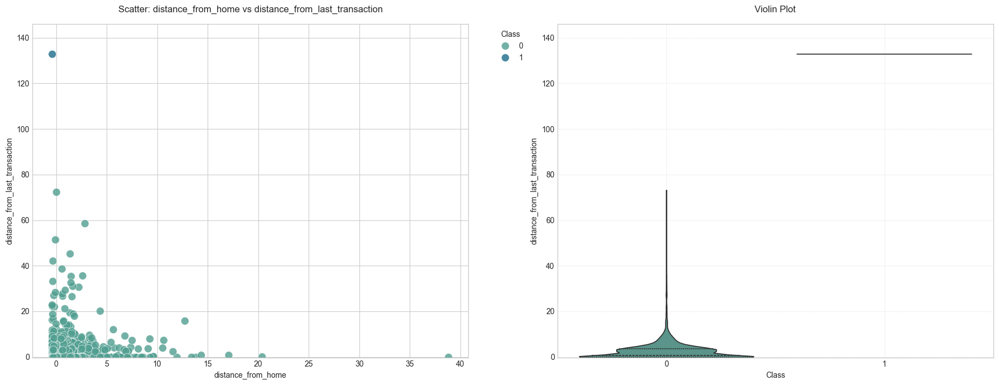

d:\Python\OmGTU\venv\Lib\site-packages\seaborn\axisgrid.py:1832: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=self.x, y=self.y, **kwargs)


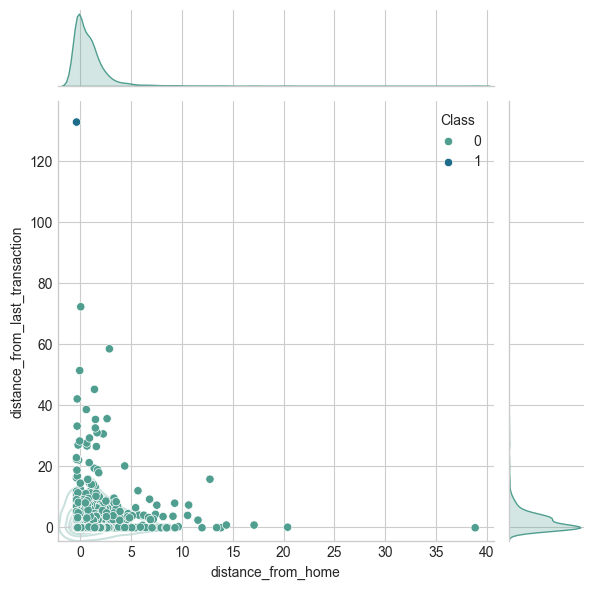

In [39]:
for name, data in dataframes.items():
    plot_cluster_analysis(data, labels['agglomeratve'][name])

### Affinity Propagation

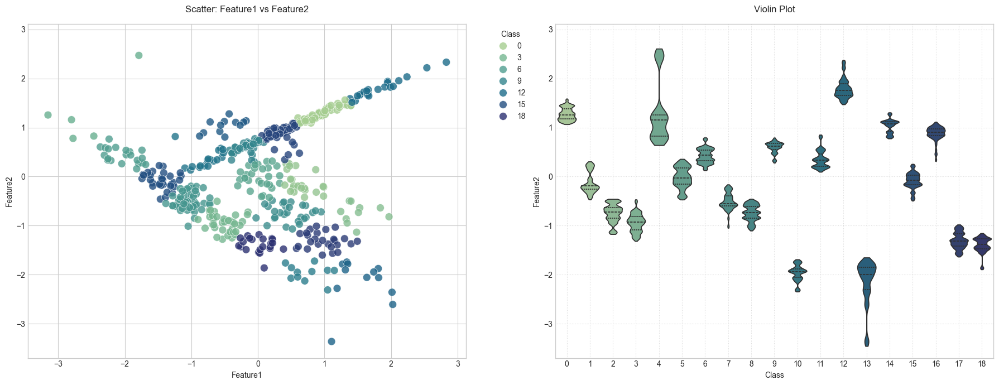

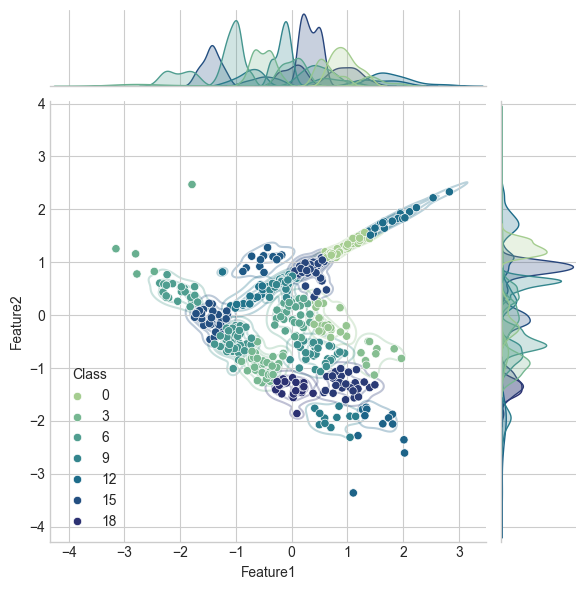

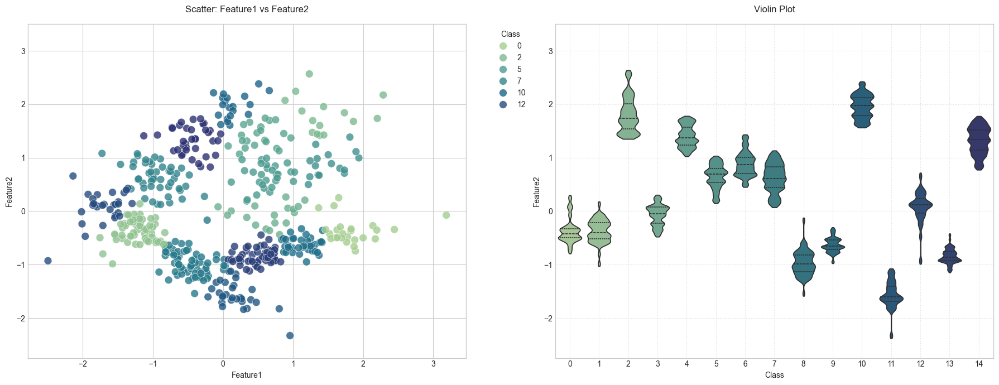

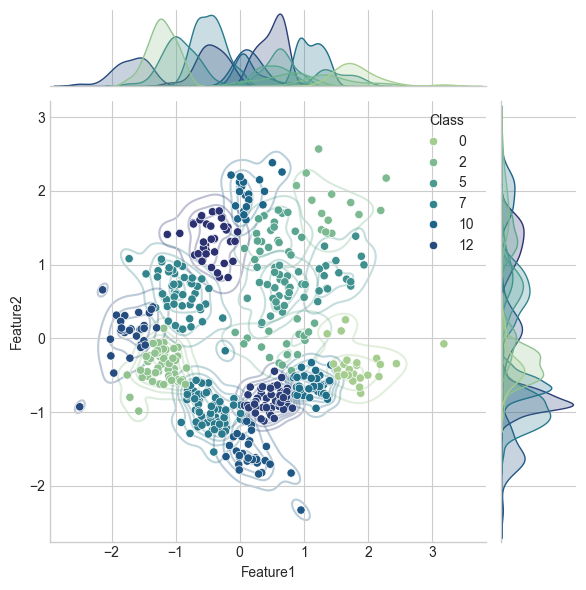

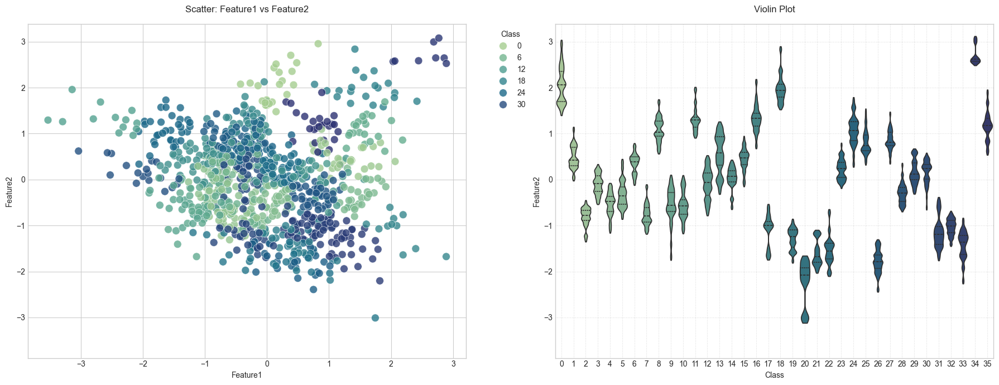

...

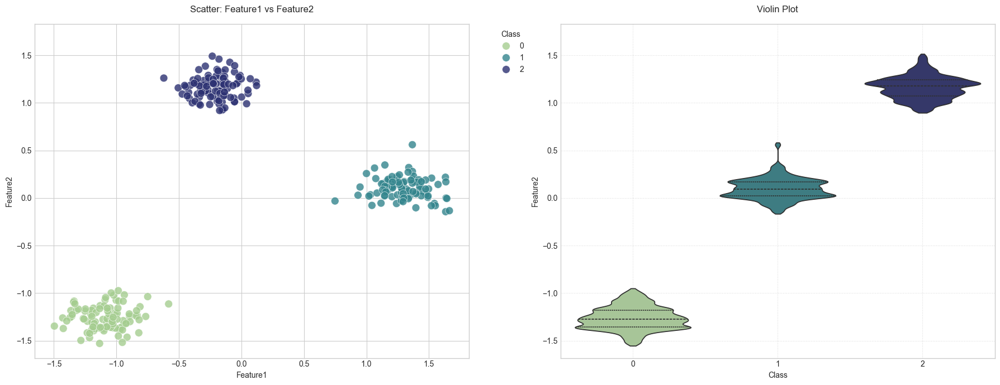

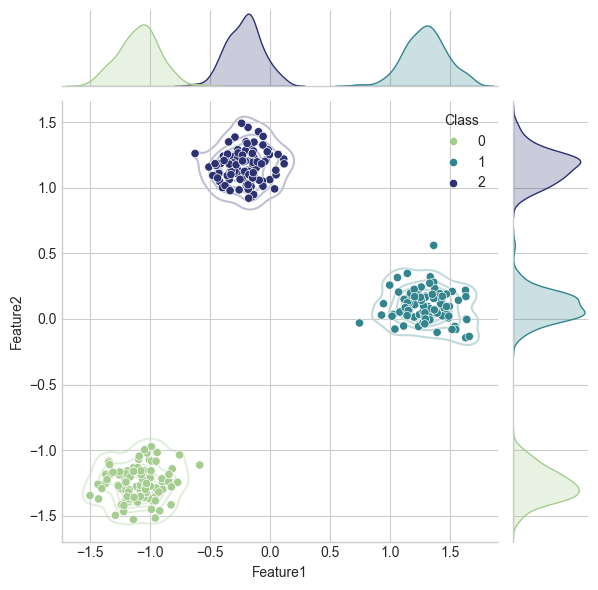

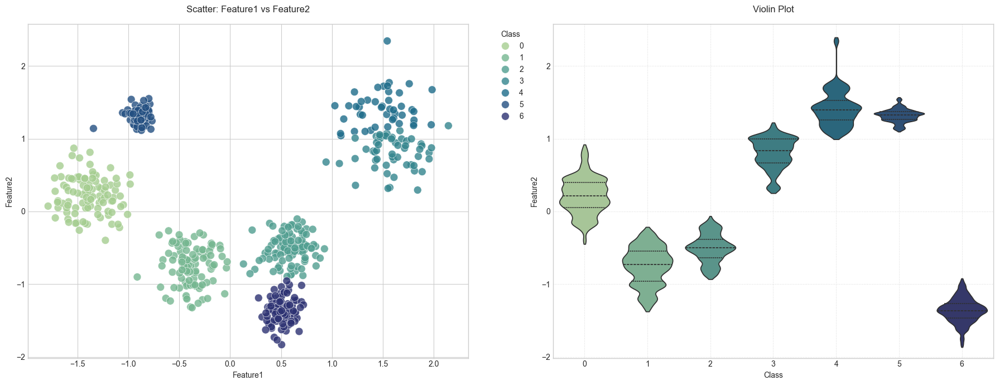

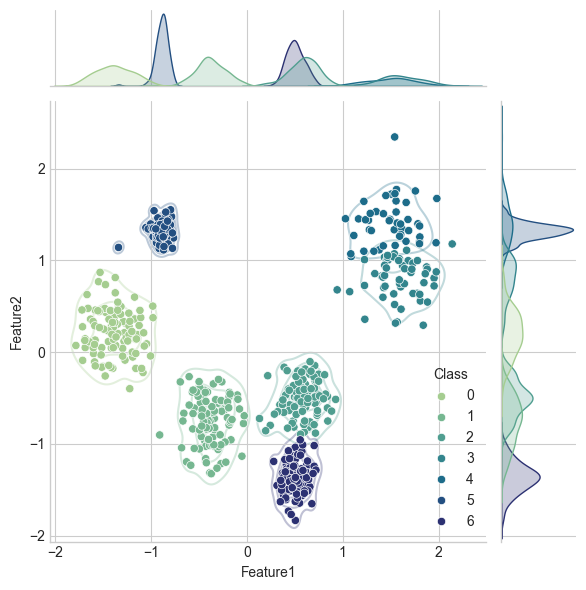

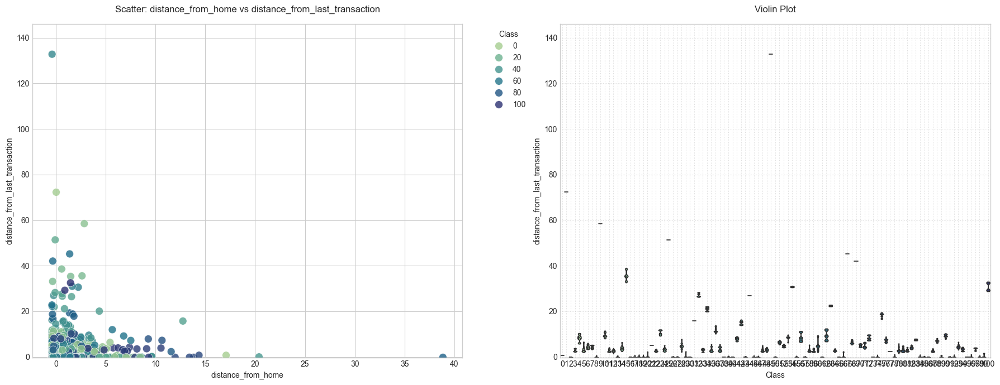

d:\Python\OmGTU\venv\Lib\site-packages\seaborn\axisgrid.py:1832: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=self.x, y=self.y, **kwargs)
d:\Python\OmGTU\venv\Lib\site-packages\seaborn\axisgrid.py:1832: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=self.x, y=self.y, **kwargs)
d:\Python\OmGTU\venv\Lib\site-packages\seaborn\axisgrid.py:1832: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=self.x, y=self.y, **kwargs)
d:\Python\OmGTU\venv\Lib\site-packages\seaborn\axisgrid.py:1832: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=self.x, y=self.y, **kwargs)
d:\Python\OmGTU\venv\Lib\site-packages\seaborn\axisgrid.py:1832: UserWarning: KDE cannot be 

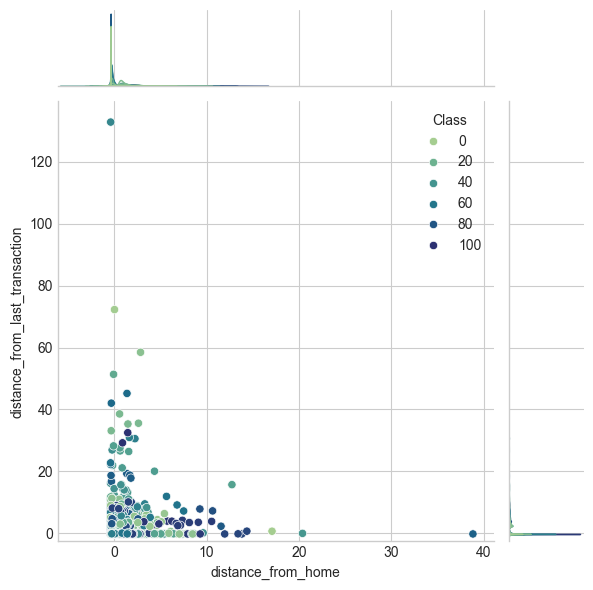

In [40]:
for name, data in dataframes.items():
    plot_cluster_analysis(data, labels['affinity'][name])

## Статистика

In [53]:
for name_alg, label in labels.items():
    for name_data, data in dataframes.items():
        df = data.copy()
        df[name_alg] = label[name_data]

        print(f'{name_alg} : {name_data}')
        print(df.groupby(name_alg)[list(data.columns)].agg(['mean', 'std', 'min', 'max']), '\n\n')

kmeans : classification_1
        Feature1                                Feature2                      \
            mean       std       min       max      mean       std       min   
kmeans                                                                         
0      -1.162687  0.575469 -3.153435 -0.094388 -0.103957  0.543155 -1.051990   
1       0.547725  0.617452 -0.615170  2.025225 -1.072412  0.594950 -3.361713   
2       0.519235  0.654962 -0.717980  2.829988  0.981912  0.450263  0.002118   

                  
             max  
kmeans            
0       2.470743  
1      -0.052654  
2       2.331976   


kmeans : classification_2
        Feature1                                Feature2                      \
            mean       std       min       max      mean       std       min   
kmeans                                                                         
0       0.456529  0.730970 -0.935401  2.284742  1.304929  0.499476  0.302319   
1       0.608243  0.689331 -0.

# 4. Оценка качества моделей

In [ ]:
def style_metrics(df):
    return df.style.background_gradient(subset=['ARI', 'NMI'], cmap=palette).background_gradient(subset=['SS', 'CH'], cmap='crest').format({
            'ARI': '{:.2f}',
            'NMI': '{:.2f}',
            'SS': '{:.2f}',
            'CH': '{:.2f}'})

final_table = []

for name_alg, label in labels.items():
    for name_data, data in dataframes.items():
        row = {'Algorithm': f'{name_alg}_{name_data}',
               'ARI': adjusted_rand_score(true_y[name_data], label[name_data]),
               'NMI': normalized_mutual_info_score(true_y[name_data], label[name_data]),
               'SS': silhouette_score(data, label[name_data]),
               'CH': calinski_harabasz_score(data, label[name_data])}
        
        final_table.append(row)

final_table = pd.DataFrame(final_table)
style_metrics(final_table)

,Algorithm,ARI,NMI,SS,CH
0,kmeans_classification_1,0.42,0.42,0.47,506.50
1,kmeans_classification_2,0.34,0.40,0.45,504.39
2,kmeans_classification_3,0.37,0.44,0.35,508.96
3,kmeans_blobs_1,1.00,1.00,0.88,7351.61
4,kmeans_blobs_2,0.56,0.80,0.66,1438.88
5,kmeans_card_transdata,0.01,0.01,0.81,974.81
6,dbscan_classification_1,-0.00,0.00,0.51,1.04
7,dbscan_classification_2,-0.00,0.00,0.43,1.71
8,dbscan_classification_3,-0.00,0.00,0.51,7.18
9,dbscan_blobs_1,1.00,1.00,0.88,7351.61


# 5. Реализация алгоритма кластеризации k-means

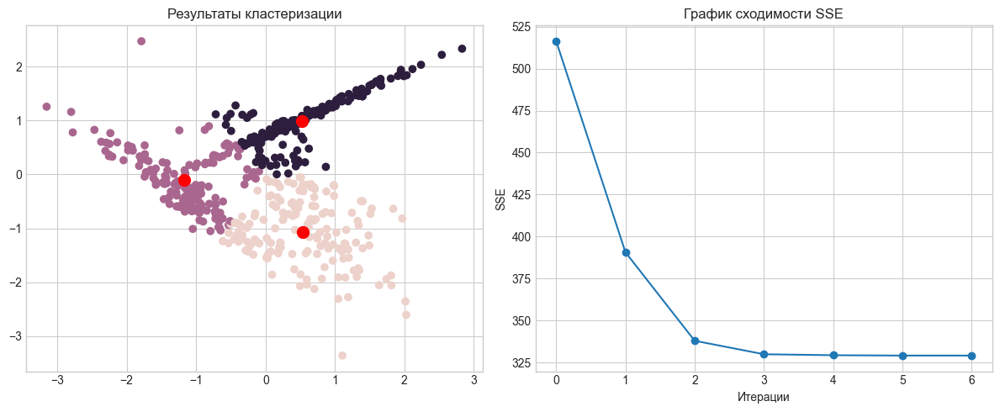

In [87]:
from algorythms.kmeans import CustomKMeans

kmeans = CustomKMeans(n_clusters=3, init='k-means++', random_state=42)
kmeans.fit(X1)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(X1[:, 0], X1[:, 1], c=kmeans.labels_, cmap=palette)
plt.scatter(kmeans.centroids[:, 0], kmeans.centroids[:, 1], c='red', s=100, marker='o')
plt.title('Результаты кластеризации')

plt.subplot(1, 2, 2)
plt.plot(kmeans.history_sse, marker='o')
plt.xlabel('Итерации')
plt.ylabel('SSE')
plt.title('График сходимости SSE')

plt.tight_layout()
plt.show()

In [96]:
custom_kmeans = []

for name_data, data in dataframes.items():
    row = {'Algorithm': f'sklearn_{name_data}',
            'ARI': adjusted_rand_score(true_y[name_data], labels['kmeans'][name_data]),
            'NMI': normalized_mutual_info_score(true_y[name_data], labels['kmeans'][name_data]),
            'SS': silhouette_score(data, labels['kmeans'][name_data]),
            'CH': calinski_harabasz_score(data, labels['kmeans'][name_data])}
    
    custom_kmeans.append(row)

    estimator = CustomKMeans(random_state=42)
    label = list(estimator.fit(data.values).predict(data.values))
    
    row = {'Algorithm': f'custom_{name_data}',
            'ARI': adjusted_rand_score(true_y[name_data], label),
            'NMI': normalized_mutual_info_score(true_y[name_data], label),
            'SS': silhouette_score(data, label),
            'CH': calinski_harabasz_score(data, label)}
    
    custom_kmeans.append(row)

custom_kmeans = pd.DataFrame(custom_kmeans)
style_metrics(custom_kmeans)

,Algorithm,ARI,NMI,SS,CH
0,sklearn_classification_1,0.42,0.42,0.47,506.50
1,custom_classification_1,0.42,0.42,0.47,506.50
2,sklearn_classification_2,0.34,0.40,0.45,504.39
3,custom_classification_2,0.34,0.40,0.45,504.39
4,sklearn_classification_3,0.37,0.44,0.35,508.96
5,custom_classification_3,0.26,0.34,0.29,413.40
6,sklearn_blobs_1,1.00,1.00,0.88,7351.61
7,custom_blobs_1,1.00,1.00,0.88,7351.61
8,sklearn_blobs_2,0.56,0.80,0.66,1438.88
9,custom_blobs_2,0.48,0.72,0.65,1338.27


# 6. Создание таблицы результатов

In [ ]:
style_metrics(final_table)

,Algorithm,ARI,NMI,SS,CH
0,kmeans_classification_1,0.42,0.42,0.47,506.50
1,kmeans_classification_2,0.34,0.40,0.45,504.39
2,kmeans_classification_3,0.37,0.44,0.35,508.96
3,kmeans_blobs_1,1.00,1.00,0.88,7351.61
4,kmeans_blobs_2,0.56,0.80,0.66,1438.88
5,kmeans_card_transdata,0.01,0.01,0.81,974.81
6,dbscan_classification_1,-0.00,0.00,0.51,1.04
7,dbscan_classification_2,-0.00,0.00,0.43,1.71
8,dbscan_classification_3,-0.00,0.00,0.51,7.18
9,dbscan_blobs_1,1.00,1.00,0.88,7351.61


# 7. Вывод

## Выбор алгоритма обработки определённого рода данных
| Тип данных       | Лучшие алгоритмы (внешние метрики) | Лучшие алгоритмы (внутренние метрики) | Лидер (общий) |
|------------------|------------------------------------|---------------------------------------|--------------|
| **classification_1** | K-Means (ARI: 0.42, NMI: 0.42)<br>Gaussian (ARI: 0.42, NMI: 0.42) | DBSCAN (SS: 0.51) | **K-Means/Gaussian** (лучшие по ARI/NMI) |
| **classification_2** | Agglomerative (ARI: 0.39, NMI: 0.44) | K-Means (CH: 504.39)<br>Gaussian (CH: 496.57) | **Agglomerative** (лучший баланс) |
| **classification_3** | Agglomerative (ARI: 0.44, NMI: 0.56) | K-Means (CH: 508.96) | **Agglomerative** (явный лидер по NMI) |
| **blobs_1** | Все (ARI: 1.00, NMI: 1.00) | Все (SS: 0.88, CH: 7351.61) | **Любой** (идеальные метрики) |
| **blobs_2** | Agglomerative (ARI: 0.98, NMI: 0.97)<br>Gaussian (ARI: 0.98, NMI: 0.98) | Gaussian (CH: 2725.55)<br>Affinity (CH: 2821.51) | **Gaussian** (лучший баланс) |
| **card_transdata** | DBSCAN (ARI: 0.06, NMI: 0.15) | Agglomerative (SS: 0.95)<br>Gaussian (CH: 1121.72) | **Agglomerative** (лучший SS) |

## Общее мнение о каждом алгоритме:
| Алгоритм       | Описание                                                                 | Результат |
|----------------|--------------------------------------------------------------------------|-----------|
| **K-Means**    | Разделяет данные на k кластеров через минимизацию расстояний до центроидов, лучше для чётко разделимых данных без шума | На практике показал себя как простой достойный алгоритм (наблюдаю сходство с KNN) |
| **DBSCAN**     | Кластеризует плотные области, игнорируя выбросы, хорош для шумных данных и кластеров произвольной формы | Хороший алгоритм, но требуется крайне тонкая настройка и очень хорошие данные |
| **Gaussian Mixture** | Моделирует данные как смесь гауссиан, подходит для перекрывающихся кластеров сложной формы | Лидер по моему мнению. Кластеры очень "красивые" и правдоподобные |
| **Agglomerative** | Иерархическая кластеризация "снизу вверх". Полезен для данных с явной вложенной структурой | Алгоритм проявил себя уверенно в положительную сторону, на разных данных получены относительно хорошие результаты |
| **Affinity Propagation** | Автоматически определяет число кластеров через "передачу сообщений" | Разбиение на кластеры неочеидно в сложных данных, следитвием чего является затруднение интерпретации |